# Necessary Libraries

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
os.environ["OMP_NUM_THREADS"] = "8"
os.environ["MKL_NUM_THREADS"] = "8"
os.environ["NUMEXPR_NUM_THREADS"] = "8"
os.environ["OPENBLAS_NUM_THREADS"] = "8"

In [2]:
import torch
print(torch.cuda.current_device())
print(torch.cuda.get_device_name(0))
print(torch.cuda.is_available())  # Should output: True
print(torch.version.cuda) 
from IPython.display import display
import argparse
import math
import logging
from pathlib import Path
from typing import Optional, List, Dict, Any
import json
import warnings
warnings.filterwarnings('ignore')

import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from PIL import Image
import numpy as np

from diffusers import (
    StableDiffusionPipeline,
    DDPMScheduler,
    UNet2DConditionModel,
    AutoencoderKL
)
from transformers import CLIPTextModel, CLIPTokenizer
from peft import LoraConfig, get_peft_model, TaskType
from accelerate import Accelerator
from accelerate.logging import get_logger
from accelerate.utils import set_seed
import wandb

0
NVIDIA RTX A4500
True
12.1


## Some Examples of Image Generation using Stable Diffusion

I will start by demonstrating some example images generated by the pretrained Stable Diffusion v1-5 model. Stable Diffusion uses a denoising diffusion process that progressively refines noise into an image conditioned on text embeddings obtained from a pretrained text encoder like CLIP. The prompt guides this process so that the output image matches the described scene. This baseline pipeline is foundational for building more advanced subject and style transfer techniques, such as those implemented using DreamBooth and LoRA.
The difference between stable diffusion and a usual diffusion model is that here, we first use a VAE to get the image representation in the latent space and then apply the diffusion process (that is adding noise upto certain time steps and then going backward and predicting this noise at each time step). Finally, we pass this denoised latent representation throught the Decoder of the VAE to get the desired image.

In [24]:
pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16, 
    use_safetensors=True,
    safety_checker=None
)
pipe = pipe.to("cuda")


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 11.24it/s]
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In the above snippet, I have disabled safety checker for seemless generation. If not disabled, I found that the model treats even the most innocent prompts as NSFW and thereby outputs a black image.

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:02<00:00, 19.16it/s]


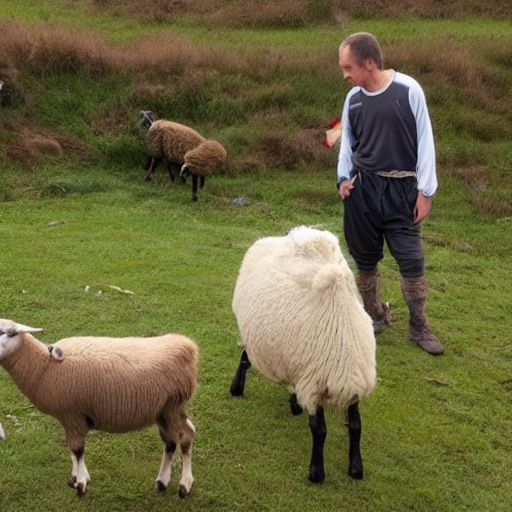

In [25]:
prompt = "goat talking to a sheep"
result = pipe(prompt, height=512, width=512)  # Lower resolution helps
image = result.images[0]
display(image)

As can be seen from the above image, given the input prompt "A dog wearing a suit and tie, sitting at a desk with a laptop, in an office setting, professional lighting, high detail," the model generates a high quality image conditioned on the textual description. The promt and subject alignment can be seen to be very efficient. The generated image resolution is set to 512 by 512 pixels, balancing image quality with computational resources.

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:02<00:00, 19.08it/s]


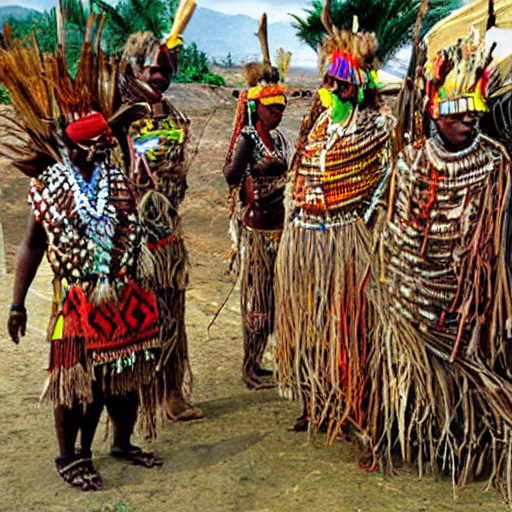

In [26]:
prompt = "A real tribal scene"
result = pipe(prompt, height=512, width=512)  # Lower resolution helps
image = result.images[0]
display(image)

# Implementing Subject Transfer With DreamBooth + LoRA

Next, I focus on implementing the first task: subject transfer. A common limitation of many recent personalization methods is that they fine-tune all the parameters of the base diffusion model, which can be computationally expensive and memory-intensive. To address this, one effective approach is to use LoRA (Low-Rank Adaptation). LoRA reduces the number of trainable parameters by decomposing large weight matrices into low-rank components and training only these smaller matrices, rather than the full high-rank weights.

In the original DreamBooth architecture, the entire UNet component of the base model is fine-tuned, resulting in a large number of parameters to update. Instead, by selectively training only the cross-attention layers within the UNet and injecting LoRA modules, it is possible to achieve strong subject and style fidelity while significantly reducing the training cost. In this notebook, I implement a version of DreamBooth enhanced with LoRA to efficiently personalize the model for subject transfer.

## Prepare the Dataset

In [3]:
def prepare_training_data(source_dir: str, output_dir: str, target_size: int = 512):
    """
    Utility function to prepare training data
    
    Args:
        source_dir: Directory containing source images
        output_dir: Directory to save processed images
        target_size: Target image size
    """
    import os
    from PIL import Image
    import shutil
    
    os.makedirs(output_dir, exist_ok=True)
    
    valid_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff'}
    
    for filename in os.listdir(source_dir):
        if any(filename.lower().endswith(ext) for ext in valid_extensions):
            src_path = os.path.join(source_dir, filename)
            dst_path = os.path.join(output_dir, filename)
            
            try:
                with Image.open(src_path) as img:
                    if img.mode != 'RGB':
                        img = img.convert('RGB')
                    
                    img = img.resize((target_size, target_size), Image.Resampling.LANCZOS)
                    img.save(dst_path, 'JPEG', quality=95)
                    
                print(f"Processed: {filename}")
                
            except Exception as e:
                print(f"Error processing {filename}: {e}")


def generate_class_images(
    class_prompt: str,
    output_dir: str,
    num_images: int = 500,
    model_id: str = "runwayml/stable-diffusion-v1-5"
):
    """
    Generate class images for prior preservation
    
    Args:
        class_prompt: Prompt for generating class images
        output_dir: Directory to save class images
        num_images: Number of class images to generate
        model_id: Model to use for generation
    """
    from diffusers import StableDiffusionPipeline
    import torch
    import os
    
    os.makedirs(output_dir, exist_ok=True)
    
    pipe = StableDiffusionPipeline.from_pretrained(
        model_id,
        torch_dtype=torch.float16,
        safety_checker=None,
        use_safetensors=True,
        requires_safety_checker=False
    )
    pipe = pipe.to("cuda")

    # Generate images
    for i in range(num_images):
        with torch.autocast("cuda"):
            image = pipe(
                class_prompt,
                num_inference_steps=50,
                guidance_scale=7.5,
                height = 512,
                width = 512,
                generator=torch.Generator(device="cuda").manual_seed(i)
            ).images[0]
        
        image.save(os.path.join(output_dir, f"class_{i:04d}.jpg"))
        
        if (i + 1) % 10 == 0:
            print(f"Generated {i + 1}/{num_images} class images")
    
    print(f"Class image generation completed! Saved to {output_dir}")



The first function, prepare_training_data, handles preprocessing of user-provided images that depict the custom subject or style. It takes raw images from a source directory, converts them to RGB if needed, resizes them to a fixed square shape (default 512x512), and saves the processed images to a new directory in JPEG format. This normalization step ensures all training images conform to the expected input size of the Stable Diffusion model. The use of Image.Resampling.LANCZOS provides high-quality downscaling for better detail preservation.

The second function, generate_class_images, creates class images used for prior preservation, a key component of the DreamBooth method. Prior preservation helps avoid overfitting by anchoring the model's concept of the original class, such as “a dog,” while it learns a specific instance like “<my_dog>.” To generate these class images, a Stable Diffusion pipeline is loaded using the specified model_id. The pipeline then samples a number of images based on a generic class prompt (e.g., "a photo of a dog") and saves them to the output directory. Each image is generated with a fixed seed for reproducibility, and standard generation parameters are used, such as 50 inference steps and a guidance scale of 7.5.

In DreamBooth training, the final dataset consists of both user images (e.g., 3–5 pictures of the custom subject) and these generated class images. The training objective balances the reconstruction of the custom subject while preserving the broader semantics of the class it belongs to.

In [ ]:
print("Preparing training data...")
    
# instance images
prepare_training_data(
        source_dir="./raw_images/subject_bag",
        output_dir="./data/subject/bag/subject_instance_images",
        target_size=512
    )
    
# Class images
generate_class_images(
        class_prompt="An image of a bag",
        output_dir="./data/subject/bag/subject_class_images",
        num_images=500
    )
    
print("Data preparation completed!")

## Setting Up Logger

In [5]:
logging.basicConfig(
    format="%(asctime)s - %(levelname)s - %(name)s - %(message)s",
    datefmt="%m/%d/%Y %H:%M:%S",
    level=logging.INFO,
)
logger = get_logger(__name__)

## Dataset creation for DreamBooth

Next, a custom dataset class is created to load and preprocess both the instance images (containing the subject) and optionally class images (for prior preservation). Each image is resized to 512x512 and normalized appropriately. The associated prompts are tokenized using the CLIP tokenizer. During training, the dataloader returns a dictionary containing the processed image tensors along with their corresponding tokenized prompts. This setup supports DreamBooth-style training where both instance and class images can be used together.

In [6]:
class DreamBoothDataset(Dataset):
    """
    Dataset for DreamBooth training with LoRA
    """
    
    def __init__(
        self,
        instance_data_root: str,
        instance_prompt: str,
        tokenizer: CLIPTokenizer,
        class_data_root: Optional[str] = None,
        class_prompt: Optional[str] = None,
        size: int = 512,
        center_crop: bool = False,
    ):
        self.size = size
        self.center_crop = center_crop
        self.tokenizer = tokenizer
        self.instance_prompt = instance_prompt
        self.class_prompt = class_prompt

        self.instance_data_root = Path(instance_data_root)
        if not self.instance_data_root.exists():
            raise ValueError(f"Instance data root {self.instance_data_root} does not exist")

        # Load instance images
        self.instance_images_path = list(Path(instance_data_root).iterdir())
        self.num_instance_images = len(self.instance_images_path)

        # Load class images if provided (for prior preservation)
        self.class_images_path = None
        if class_data_root is not None:
            self.class_data_root = Path(class_data_root)
            if self.class_data_root.exists():
                self.class_images_path = list(self.class_data_root.iterdir())

        # Image transforms
        self.image_transforms = transforms.Compose([
            transforms.Resize(size, interpolation=transforms.InterpolationMode.BILINEAR),
            transforms.CenterCrop(size) if center_crop else transforms.RandomCrop(size),
            transforms.ToTensor(),
            transforms.Normalize([0.5], [0.5]),
        ])

    def __len__(self):
        return self.num_instance_images

    def __getitem__(self, index):
        example = {}
        
        # Load and process instance image
        instance_image = Image.open(self.instance_images_path[index % self.num_instance_images])
        if not instance_image.mode == "RGB":
            instance_image = instance_image.convert("RGB")
        example["instance_images"] = self.image_transforms(instance_image)

        # Tokenize instance prompt
        example["instance_prompt_ids"] = self.tokenizer(
            self.instance_prompt,
            padding="do_not_pad",
            truncation=True,
            max_length=self.tokenizer.model_max_length,
        ).input_ids

        # Handle class images for prior preservation
        if self.class_images_path:
            class_image = Image.open(self.class_images_path[index % len(self.class_images_path)])
            if not class_image.mode == "RGB":
                class_image = class_image.convert("RGB")
            example["class_images"] = self.image_transforms(class_image)
            
            example["class_prompt_ids"] = self.tokenizer(
                self.class_prompt,
                padding="do_not_pad",
                truncation=True,
                max_length=self.tokenizer.model_max_length,
            ).input_ids

        return example

## Collate Function for Getting Batches

I implemented a custom collate_fn to batch the dataset samples properly during training. It handles padding of the tokenized prompts to make them of the same length and stacks the image tensors. If prior preservation is enabled, it also processes class images and their corresponding prompts. This function ensures that both instance and class data are correctly formatted and padded before being passed to the model during training.

In [7]:
def collate_fn(examples, with_prior_preservation=False):
    """Collate function for the DataLoader"""
    input_ids = [example["instance_prompt_ids"] for example in examples]
    pixel_values = [example["instance_images"] for example in examples]

    input_ids = torch.nn.utils.rnn.pad_sequence(
        [torch.tensor(ids) for ids in input_ids], 
        batch_first=True, 
        padding_value=0
    )
    
    pixel_values = torch.stack(pixel_values)
    pixel_values = pixel_values.to(memory_format=torch.contiguous_format).float()

    batch = {"input_ids": input_ids, "pixel_values": pixel_values}

    if with_prior_preservation:
        class_input_ids = [example["class_prompt_ids"] for example in examples]
        class_pixel_values = [example["class_images"] for example in examples]
        
        class_input_ids = torch.nn.utils.rnn.pad_sequence(
            [torch.tensor(ids) for ids in class_input_ids],
            batch_first=True,
            padding_value=0
        )
        
        class_pixel_values = torch.stack(class_pixel_values)
        class_pixel_values = class_pixel_values.to(memory_format=torch.contiguous_format).float()
        
        batch["class_input_ids"] = class_input_ids
        batch["class_pixel_values"] = class_pixel_values

    return batch

## LoRA DreamBooth Trainer for Personlized text to image generation

In this section, I describe the motivation, mathematical formulation, and design decisions behind the `LoRADreamBoothTrainer` class. This implementation builds upon the methodology introduced in the original DreamBooth paper, while integrating LoRA (Low-Rank Adaptation) to improve training efficiency and reduce memory consumption.

The objective here is to personalize a pre-trained text-to-image diffusion model such as Stable Diffusion to learn and represent a specific subject instance from only 3–5 images. The model should be able to generate novel views, poses, and compositions of the subject without forgetting its general understanding of the base class (e.g., “dog”, “person”, etc.).

In the original DreamBooth method, the entire UNet is fine-tuned, and optionally the text encoder as well. This full finetuning approach is computationally expensive, memory-intensive, and prone to overfitting. To address these issues, I replace full parameter finetuning with LoRA, which injects low-rank matrices into key layers of the model and trains only those matrices while keeping the rest of the model frozen.

### Diffusion Objective

DreamBooth builds on the Denoising Diffusion Probabilistic Model (DDPM) framework. In this setup, an image $ \mathbf{x} $ is gradually perturbed by noise over a series of timesteps. The forward process is defined by a noisy latent:

$$
\mathbf{z}_t = \alpha_t \mathbf{x} + \sigma_t \boldsymbol{\epsilon}
$$

where $ \boldsymbol{\epsilon} \sim \mathcal{N}(0, \mathbf{I}) $, and $ \alpha_t, \sigma_t $ are schedule-dependent scalars at timestep $ t \sim \mathcal{U}(0, T) $. The model is trained to predict the noise $ \boldsymbol{\epsilon} $ using a neural network $ \hat{\boldsymbol{\epsilon}}_\theta $ conditioned on a text embedding $ \mathbf{c} $:

$$
\mathbb{E}_{\mathbf{x}, \mathbf{c}, \boldsymbol{\epsilon}, t} \left[ w_t \cdot \left\| \hat{\boldsymbol{\epsilon}}_\theta(\alpha_t \mathbf{x} + \sigma_t \boldsymbol{\epsilon}, \mathbf{c}) - \boldsymbol{\epsilon} \right\|_2^2 \right]
$$

The term $ \mathbf{c} $ is obtained by encoding the user prompt using a CLIP-based tokenizer and text encoder. In the implementation, this loss is computed using a standard mean squared error loss between the predicted and true noise.

### Prior Preservation Loss

To avoid overfitting to the subject and to preserve general class information, DreamBooth introduces a prior-preserving loss. In addition to instance images with prompts such as “a photo of [V] dog”, the model is trained on generic class images like “a photo of a dog”. The prior loss ensures the model retains its ability to generate generic samples from the base class, preventing output collapse or subject overrepresentation.

The final loss function combines the instance loss and the class-specific prior loss:

$$
\mathcal{L} = \mathbb{E}_{\text{inst}} \left[ w_t \cdot \left\| \hat{\boldsymbol{\epsilon}}_\theta(\mathbf{z}_t, \mathbf{c}) - \boldsymbol{\epsilon} \right\|_2^2 \right] + \lambda \cdot \mathbb{E}_{\text{class}} \left[ w_t \cdot \left\| \hat{\boldsymbol{\epsilon}}_\theta(\mathbf{z}_{t,\text{pr}}, \mathbf{c}_{\text{pr}}) - \boldsymbol{\epsilon} \right\|_2^2 \right]
$$

Here, $ \mathbf{z}_{t,\text{pr}} $ is the noisy latent of a class image, $ \mathbf{c}_{\text{pr}} $ is the class prompt, and $ \lambda $ is a hyperparameter controlling the balance between instance learning and prior preservation. This formulation is directly implemented in the `train_step()` method of the `LoRADreamBoothTrainer` class.

### LoRA for DreamBooth

While effective, full model finetuning is not practical for many users due to hardware constraints. LoRA addresses this by reducing the number of trainable parameters. Instead of updating the full weight matrix $ W \in \mathbb{R}^{d \times k} $, LoRA approximates it as a product of two lower-rank matrices:

$$
W \approx AB, \quad A \in \mathbb{R}^{d \times r}, \quad B \in \mathbb{R}^{r \times k}
$$

Only $ A $ and $ B $ are updated during training, while the base weights are kept frozen. In the UNet, LoRA is applied to the cross-attention projection layers: `to_q`, `to_k`, `to_v`, and `to_out.0`. If enabled, LoRA is also applied to the text encoder in projection layers such as `q_proj` and `v_proj`.

This leads to substantial memory and speed improvements while maintaining generation quality and subject fidelity.

In [8]:
class LoRADreamBoothTrainer:
    """
    LoRA DreamBooth Trainer for personalized text-to-image generation
    """
    
    def __init__(self, config: Dict[str, Any]):
        self.config = config
        self.accelerator = Accelerator(
            gradient_accumulation_steps=config["gradient_accumulation_steps"],
            mixed_precision=config["mixed_precision"],
            log_with="wandb" if config["use_wandb"] else None,
            project_dir=config["output_dir"],
        )

        self.logger = get_logger(__name__, log_level="INFO")
        if config["seed"] is not None:
            set_seed(config["seed"])

        # Load models
        self.load_models()
        
        # Setup LoRA
        self.setup_lora()
        
        # Setup dataset and dataloader
        self.setup_data()
        
        # Setup optimizer and scheduler
        self.setup_training()

    def load_models(self):
        """Load the pretrained models"""
        self.logger.info("Loading pretrained models...")
        
        # Load tokenizer and text encoder
        self.tokenizer = CLIPTokenizer.from_pretrained(
            self.config["pretrained_model_name_or_path"],
            subfolder="tokenizer"
        )
        
        self.text_encoder = CLIPTextModel.from_pretrained(
            self.config["pretrained_model_name_or_path"],
            subfolder="text_encoder"
        )
        
        # VAE
        self.vae = AutoencoderKL.from_pretrained(
            self.config["pretrained_model_name_or_path"],
            subfolder="vae"
        )
        
        # UNet
        self.unet = UNet2DConditionModel.from_pretrained(
            self.config["pretrained_model_name_or_path"],
            subfolder="unet"
        )
        
        # Noise scheduler
        self.noise_scheduler = DDPMScheduler.from_pretrained(
            self.config["pretrained_model_name_or_path"],
            subfolder="scheduler"
        )

        # Freeze models
        self.vae.requires_grad_(False)
        if not self.config["train_text_encoder"]:
            self.text_encoder.requires_grad_(False)

    def setup_lora(self):
        """Setup LoRA configuration and apply to models"""
        self.logger.info("Setting up LoRA...")
        
        # LoRA config for UNet
        unet_lora_config = LoraConfig(
            r=self.config["lora_rank"],
            lora_alpha=self.config["lora_alpha"],
            target_modules=["to_k", "to_q", "to_v", "to_out.0"],
            lora_dropout=self.config["lora_dropout"],
        )
        
        # Applying LoRA to UNet
        self.unet = get_peft_model(self.unet, unet_lora_config)
        
        # Applying LoRA to text encoder if training
        if self.config["train_text_encoder"]:
            text_encoder_lora_config = LoraConfig(
                r=self.config["lora_rank"],
                lora_alpha=self.config["lora_alpha"],
                target_modules=["q_proj", "v_proj", "k_proj", "out_proj"],
                lora_dropout=self.config["lora_dropout"],
            )
            self.text_encoder = get_peft_model(self.text_encoder, text_encoder_lora_config)

    def setup_data(self):
        """Setup dataset and dataloader"""
        self.logger.info("Setting up dataset...")
        
        self.train_dataset = DreamBoothDataset(
            instance_data_root=self.config["instance_data_dir"],
            instance_prompt=self.config["instance_prompt"],
            class_data_root=self.config["class_data_dir"],
            class_prompt=self.config["class_prompt"],
            tokenizer=self.tokenizer,
            size=self.config["resolution"],
            center_crop=self.config["center_crop"],
        )

        def collate_fn_wrapper(examples):
            return collate_fn(examples, self.config["with_prior_preservation"])

        self.train_dataloader = DataLoader(
            self.train_dataset,
            batch_size=self.config["train_batch_size"],
            shuffle=True,
            collate_fn=collate_fn_wrapper,
            num_workers=self.config["dataloader_num_workers"],
        )

    def setup_training(self):
        """Setup optimizer, scheduler, and training parameters"""
        self.logger.info("Setting up training...")
        
        # Collect trainable parameters
        params_to_optimize = []
        
        # Add UNet LoRA parameters
        for param in self.unet.parameters():
            if param.requires_grad:
                params_to_optimize.append(param)
        
        # Add text encoder LoRA parameters if training
        if self.config["train_text_encoder"]:
            for param in self.text_encoder.parameters():
                if param.requires_grad:
                    params_to_optimize.append(param)

        # Setup optimizer
        if self.config.get("use_8bit_adam", False):
            try:
                import bitsandbytes
                from bitsandbytes.optim import AdamW8bit
                self.optimizer = AdamW8bit(
                    params_to_optimize,
                    lr=self.config["learning_rate"],
                    betas=(self.config["adam_beta1"], self.config["adam_beta2"]),
                    weight_decay=self.config["adam_weight_decay"],
                    eps=self.config["adam_epsilon"],
                )
                self.logger.info("Using 8-bit Adam optimizer (AdamW8bit).")
            except ImportError:
                self.logger.error("`bitsandbytes` not installed. Install it with `pip install bitsandbytes`.")
                raise
        else:
            self.optimizer = torch.optim.AdamW(
                params_to_optimize,
                lr=self.config["learning_rate"],
                betas=(self.config["adam_beta1"], self.config["adam_beta2"]),
                weight_decay=self.config["adam_weight_decay"],
                eps=self.config["adam_epsilon"],
            )


        # Calculate training steps
        self.num_update_steps_per_epoch = math.ceil(
            len(self.train_dataloader) / self.config["gradient_accumulation_steps"]
        )
        
        if self.config["max_train_steps"] is None:
            self.config["max_train_steps"] = (
                self.config["num_train_epochs"] * self.num_update_steps_per_epoch
            )
        
        # Setup learning rate scheduler
        from transformers import get_scheduler
        
        self.lr_scheduler = get_scheduler(
            self.config["lr_scheduler"],
            optimizer=self.optimizer,
            num_warmup_steps=self.config["lr_warmup_steps"],
            num_training_steps=self.config["max_train_steps"],
        )

        # Prepare for training with accelerator
        if self.config["train_text_encoder"]:
            self.unet, self.text_encoder, self.optimizer, self.train_dataloader, self.lr_scheduler = self.accelerator.prepare(
                self.unet, self.text_encoder, self.optimizer, self.train_dataloader, self.lr_scheduler
            )
        else:
            self.unet, self.optimizer, self.train_dataloader, self.lr_scheduler = self.accelerator.prepare(
                self.unet, self.optimizer, self.train_dataloader, self.lr_scheduler
            )

        # Move models to device
        self.vae.to(self.accelerator.device, dtype=torch.float32)
        if not self.config["train_text_encoder"]:
            self.text_encoder.to(self.accelerator.device, dtype=torch.float32)

        # Enabling xformers memory-efficient attention
        if self.config.get("enable_xformers", True): 
            try:
                self.unet.enable_xformers_memory_efficient_attention()
                self.logger.info("Enabled xFormers memory-efficient attention.")
            except Exception as e:
                self.logger.warning(f"Failed to enable xFormers attention: {e}")

    def encode_prompt(self, prompt_ids):
        """Encode text prompts"""
        with torch.no_grad():
            prompt_embeds = self.text_encoder(prompt_ids.to(self.text_encoder.device))[0]
        return prompt_embeds

    def train_step(self, batch):
        """Single training step"""
        with self.accelerator.accumulate(self.unet):
            # Convert images to latent space
            latents = self.vae.encode(batch["pixel_values"].to(dtype=self.vae.dtype)).latent_dist.sample()
            latents = latents * self.vae.config.scaling_factor

            # Sample noise and timesteps
            noise = torch.randn_like(latents)
            bsz = latents.shape[0]
            timesteps = torch.randint(
                0, self.noise_scheduler.config.num_train_timesteps, (bsz,), device=latents.device
            )
            timesteps = timesteps.long()

            # Add noise to latents
            noisy_latents = self.noise_scheduler.add_noise(latents, noise, timesteps)

            # Get text embeddings
            encoder_hidden_states = self.encode_prompt(batch["input_ids"])

            # Predict noise residual
            model_pred = self.unet(noisy_latents, timesteps, encoder_hidden_states).sample

            # Calculate loss
            loss = F.mse_loss(model_pred.float(), noise.float(), reduction="mean")

            # Handle prior preservation loss
            if self.config["with_prior_preservation"]:
                # Convert class images to latents
                class_latents = self.vae.encode(batch["class_pixel_values"].to(dtype=self.vae.dtype)).latent_dist.sample()
                class_latents = class_latents * self.vae.config.scaling_factor

                # Add noise
                class_noise = torch.randn_like(class_latents)
                class_noisy_latents = self.noise_scheduler.add_noise(class_latents, class_noise, timesteps)

                # Get class text embeddings
                class_encoder_hidden_states = self.encode_prompt(batch["class_input_ids"])

                # Predict class noise residual
                class_model_pred = self.unet(class_noisy_latents, timesteps, class_encoder_hidden_states).sample

                # Calculate class loss
                class_loss = F.mse_loss(class_model_pred.float(), class_noise.float(), reduction="mean")

                # Add class loss with weight
                loss = loss + self.config["prior_loss_weight"] * class_loss

            # Backpropagation
            self.accelerator.backward(loss)
            
            if self.accelerator.sync_gradients:
                params_to_clip = []
                if self.config["train_text_encoder"]:
                    params_to_clip.extend(self.text_encoder.parameters())
                params_to_clip.extend(self.unet.parameters())
                self.accelerator.clip_grad_norm_(params_to_clip, self.config["max_grad_norm"])

            self.optimizer.step()
            self.lr_scheduler.step()
            self.optimizer.zero_grad(set_to_none=True)

        return loss.detach().item()

    def validate(self, step):
        from peft import PeftModel
        from diffusers import StableDiffusionPipeline, DDPMScheduler

        self.logger.info("Running validation...")

        # Unwrap PEFT model and extract base UNet
        unet = self.accelerator.unwrap_model(self.unet)
        if isinstance(unet, PeftModel):
            unet = unet.base_model.model  

        # Unwrap text encoder if training it
        text_encoder = (
            self.accelerator.unwrap_model(self.text_encoder)
            if self.config.get("train_text_encoder", False)
            else self.text_encoder
        )

        # Build pipeline
        pipeline = StableDiffusionPipeline.from_pretrained(
            self.config["pretrained_model_name_or_path"],
            unet=unet,
            text_encoder=text_encoder,
            tokenizer=self.tokenizer,
            safety_checker=None,
            requires_safety_checker=False,
            torch_dtype=torch.float16,
        )

        pipeline.scheduler = DDPMScheduler.from_config(pipeline.scheduler.config)
        pipeline = pipeline.to(self.accelerator.device)
        pipeline.set_progress_bar_config(disable=True)

        generator = (
            torch.Generator(device=self.accelerator.device).manual_seed(self.config["seed"])
            if self.config.get("seed") else None
        )

        with torch.autocast("cuda", dtype=torch.float32):
            images = pipeline(
                self.config["validation_prompt"],
                num_images_per_prompt=self.config["num_validation_images"],
                num_inference_steps=50,
                height=512,
                width=512,
                generator=generator,
            ).images

        for i, image in enumerate(images):
            image.save(os.path.join(self.config["output_dir"], f"validation_step_{step}_img_{i}.png"))

        if self.config.get("use_wandb", False):
            import wandb
            wandb_images = [wandb.Image(image, caption=f"Step {step}") for image in images]
            wandb.log({"validation_images": wandb_images}, step=step)

        del pipeline
        torch.cuda.empty_cache()



    def save_checkpoint(self, step):
        """Save model checkpoint"""
        save_path = os.path.join(self.config["output_dir"], f"checkpoint-{step}")
        os.makedirs(save_path, exist_ok=True)
        
        # Save UNet LoRA
        unwrapped_unet = self.accelerator.unwrap_model(self.unet)
        unwrapped_unet.save_pretrained(os.path.join(save_path, "unet"))
        
        # Save text encoder LoRA if training
        if self.config["train_text_encoder"]:
            unwrapped_text_encoder = self.accelerator.unwrap_model(self.text_encoder)
            unwrapped_text_encoder.save_pretrained(os.path.join(save_path, "text_encoder"))
        
        self.logger.info(f"Saved checkpoint to {save_path}")

    def train(self):
        """Main training loop"""
        self.logger.info("Starting training...")
        
        if self.config["use_wandb"]:
            self.accelerator.init_trackers(
                project_name="lora_dreambooth",
                config=self.config,
            )

        global_step = 0
        progress_bar = None
        
        if self.accelerator.is_main_process:
            from tqdm.auto import tqdm
            progress_bar = tqdm(
                range(self.config["max_train_steps"]),
                desc="Training",
            )

        for epoch in range(self.config["num_train_epochs"]):
            self.unet.train()
            if self.config["train_text_encoder"]:
                self.text_encoder.train()

            train_loss = 0.0
            
            for step, batch in enumerate(self.train_dataloader):
                loss = self.train_step(batch)
                train_loss += loss

                if self.accelerator.sync_gradients:
                    if progress_bar is not None:
                        progress_bar.update(1)
                    global_step += 1

                    # Logging
                    logs = {
                        "step_loss": loss,
                        "lr": self.lr_scheduler.get_last_lr()[0],
                    }
                    
                    if self.config["use_wandb"]:
                        self.accelerator.log(logs, step=global_step)

                    if global_step % self.config["validation_steps"] == 0:
                        if self.accelerator.is_main_process:
                            self.validate(global_step)

                    if global_step % self.config["checkpointing_steps"] == 0:
                        if self.accelerator.is_main_process:
                            self.save_checkpoint(global_step)

                    if global_step >= self.config["max_train_steps"]:
                        break

            avg_train_loss = train_loss / len(self.train_dataloader)
            self.logger.info(f"Epoch {epoch} completed. Average loss: {avg_train_loss:.4f}")


        if self.accelerator.is_main_process:
            self.save_checkpoint("final")
            self.logger.info("Training completed!")

        self.accelerator.end_training()

## Parser Arguments

In [9]:
def parse_args():
    """Parse command line arguments"""
    parser = argparse.ArgumentParser(description="Train LoRA DreamBooth model")
    
    # Model arguments
    parser.add_argument(
        "--pretrained_model_name_or_path",
        type=str,
        default="runwayml/stable-diffusion-v1-5",
        help="Path to pretrained model or model identifier from huggingface.co/models.",
    )
    
    # Data arguments
    parser.add_argument(
        "--instance_data_dir",
        type=str,
        required=True,
        help="A folder containing the training data of instance images.",
    )
    parser.add_argument(
        "--class_data_dir",
        type=str,
        default=None,
        help="A folder containing the training data of class images.",
    )
    parser.add_argument(
        "--instance_prompt",
        type=str,
        required=True,
        help="The prompt with identifier specifying the instance",
    )
    parser.add_argument(
        "--class_prompt",
        type=str,
        default=None,
        help="The prompt to specify images in the same class as provided instance images.",
    )
    parser.add_argument(
        "--with_prior_preservation",
        default=False,
        action="store_true",
        help="Flag to add prior preservation loss.",
    )
    parser.add_argument(
        "--prior_loss_weight",
        type=float,
        default=1.0,
        help="The weight of prior preservation loss.",
    )
    parser.add_argument(
        "--validation_prompt",
        type=str,
        default=None,
        help="A prompt that is used during validation to verify that the model is learning.",
    )
    parser.add_argument(
        "--num_validation_images",
        type=int,
        default=4,
        help="Number of images that should be generated during validation with `validation_prompt`.",
    )
    
    # Training arguments
    parser.add_argument(
        "--output_dir",
        type=str,
        default="lora-dreambooth-model",
        help="The output directory where the model predictions and checkpoints will be written.",
    )
    parser.add_argument("--seed", type=int, default=None, help="A seed for reproducible training.")
    parser.add_argument(
        "--resolution",
        type=int,
        default=512,
        help="The resolution for input images, all the images in the train/validation dataset will be resized to this resolution",
    )
    parser.add_argument(
        "--center_crop",
        default=False,
        action="store_true",
        help="Whether to center crop the input images to the resolution. If not set, the images will be randomly cropped.",
    )
    parser.add_argument(
        "--train_text_encoder",
        action="store_true",
        help="Whether to train the text encoder. If set, the text encoder should be float32 precision.",
    )
    parser.add_argument(
        "--train_batch_size", type=int, default=1, help="Batch size (per device) for the training dataloader."
    )
    parser.add_argument("--num_train_epochs", type=int, default=1)
    parser.add_argument(
        "--max_train_steps",
        type=int,
        default=None,
        help="Total number of training steps to perform.  If provided, overrides num_train_epochs.",
    )
    parser.add_argument(
        "--checkpointing_steps",
        type=int,
        default=500,
        help="Save a checkpoint of the training state every X updates",
    )
    parser.add_argument(
        "--gradient_accumulation_steps",
        type=int,
        default=1,
        help="Number of updates steps to accumulate before performing a backward/update pass.",
    )
    parser.add_argument(
        "--gradient_checkpointing",
        action="store_true",
        help="Whether or not to use gradient checkpointing to save memory at the expense of slower backward pass.",
    )
    parser.add_argument(
        "--learning_rate",
        type=float,
        default=5e-4,
        help="Initial learning rate (after the potential warmup period) to use.",
    )
    parser.add_argument(
        "--lr_scheduler",
        type=str,
        default="constant",
        help='The scheduler type to use. Choose between ["linear", "cosine", "cosine_with_restarts", "polynomial", "constant", "constant_with_warmup"]',
    )
    parser.add_argument(
        "--lr_warmup_steps", type=int, default=500, help="Number of steps for the warmup in the lr scheduler."
    )
    parser.add_argument("--adam_beta1", type=float, default=0.9, help="The beta1 parameter for the Adam optimizer.")
    parser.add_argument("--adam_beta2", type=float, default=0.999, help="The beta2 parameter for the Adam optimizer.")
    parser.add_argument("--adam_weight_decay", type=float, default=1e-2, help="Weight decay to use.")
    parser.add_argument("--adam_epsilon", type=float, default=1e-08, help="Epsilon value for the Adam optimizer")
    parser.add_argument("--max_grad_norm", default=1.0, type=float, help="Max gradient norm.")
    
    # LoRA arguments
    parser.add_argument("--lora_rank", type=int, default=4, help="The dimension of the LoRA update matrices.")
    parser.add_argument("--lora_alpha", type=int, default=32, help="LoRA alpha parameter.")
    parser.add_argument("--lora_dropout", type=float, default=0.0, help="LoRA dropout.")
    
    # Validation arguments
    parser.add_argument(
        "--validation_steps",
        type=int,
        default=100,
        help="Run validation every X steps.",
    )
    
    # Misc arguments
    parser.add_argument(
        "--dataloader_num_workers",
        type=int,
        default=0,
        help="Number of subprocesses to use for data loading. 0 means that the data will be loaded in the main process.",
    )
    parser.add_argument(
        "--use_8bit_adam", action="store_true", help="Whether or not to use 8-bit Adam from bitsandbytes."
    )
    parser.add_argument(
        "--mixed_precision",
        type=str,
        default=None,
        choices=["no", "fp16", "bf16"],
        help="Whether to use mixed precision training.",
    )
    parser.add_argument(
        "--use_wandb",
        action="store_true",
        help="Whether to use Weights & Biases for logging.",
    )
    
    parser.add_argument(
        "--enable_xformers", action="store_true", help="Whether to enable xformers memory-efficient attention."
    )

    args = parser.parse_args()
    return args

## Training

In [8]:
def main():
    args = parse_args()
    config = vars(args)

    if config["validation_prompt"] is None:
        config["validation_prompt"] = config["instance_prompt"]

    os.makedirs(config["output_dir"], exist_ok=True)

    with open(os.path.join(config["output_dir"], "training_config.json"), "w") as f:
        json.dump(config, f, indent=2)

    trainer = LoRADreamBoothTrainer(config)
    
    trainer.train()

### For Subject Bag

In [26]:
import sys

sys.argv = [
    "lora_dreambooth.py",
    "--pretrained_model_name_or_path", "runwayml/stable-diffusion-v1-5",
    "--instance_data_dir", "./data/subject/bag/subject_instance_images",
    "--class_data_dir", "./data/subject/bag/subject_class_images",
    "--output_dir", "./output/lora-dreambooth/subject_transfer/bag",
    "--instance_prompt", "an image of tqz bag",
    "--class_prompt", "an image of a bag",
    "--with_prior_preservation",
    "--prior_loss_weight", "1.0",
    "--resolution", "512",
    "--train_batch_size", "1",
    "--gradient_accumulation_steps", "1",
    "--learning_rate", "5e-4",
    "--lr_scheduler", "constant",
    "--lr_warmup_steps", "0",
    "--num_train_epochs", "100",
    "--lora_rank", "64",
    "--lora_alpha", "32",
    "--lora_dropout", "0.0",
    "--validation_prompt", "an image of tqz bag on the beach",
    "--validation_steps", "100",
    "--checkpointing_steps", "100",
    "--use_8bit_adam",
    "--seed", "42",
    "--enable_xformers"
]


### For Subject Dog

In [9]:
import sys

sys.argv = [
    "lora_dreambooth.py",
    "--pretrained_model_name_or_path", "runwayml/stable-diffusion-v1-5",
    "--instance_data_dir", "./data/subject/dog/subject_instance_images",
    "--class_data_dir", "./data/subject/dog/subject_class_images",
    "--output_dir", "./output/lora-dreambooth/subject_transfer/dog",
    "--instance_prompt", "an image of sks dog",
    "--class_prompt", "an image of a dog",
    "--with_prior_preservation",
    "--prior_loss_weight", "1.0",
    "--resolution", "512",
    "--train_batch_size", "1",
    "--gradient_accumulation_steps", "1",
    "--learning_rate", "5e-4",
    "--lr_scheduler", "constant",
    "--lr_warmup_steps", "0",
    "--num_train_epochs", "100",
    "--lora_rank", "64",
    "--lora_alpha", "32",
    "--lora_dropout", "0.0",
    "--validation_prompt", "an image of sks dog in a suit",
    "--validation_steps", "100",
    "--checkpointing_steps", "100",
    "--use_8bit_adam",
    "--seed", "42",
    "--enable_xformers"
]

### Training

In this configuration, I train a LoRA-based DreamBooth model on the subject "tqz bag" using Stable Diffusion v1.5 as the backbone. The model is personalized using a small dataset of instance images (taken by me) and class images (generated by the pretrained diffusion model) for prior preservation, with the corresponding prompts `"an image of tqz bag"` and `"an image of a bag"`. By enabling `--with_prior_preservation` and setting `--prior_loss_weight` to `1.0`, I ensure the model balances learning the specific subject while retaining the general concept of a "bag". I use a resolution of 512 for training, which is standard and avoids memory issues, and a small batch size of 1 with no gradient accumulation, which suits lower-end GPUs but may increase training time. The learning rate is relatively high at `5e-4` with a constant scheduler and no warmup, meaning training starts aggressively and could converge faster, though it might also risk instability without proper regularization. I train for 100 epochs, which is substantial and likely sufficient to overfit on a small subject dataset. The LoRA settings (`--lora_rank 64`, `--lora_alpha 32`, `--lora_dropout 0.0`) suggest moderately high capacity with no regularization via dropout, maximizing learning but increasing the risk of overfitting. Validation is performed every 100 steps using a specific composition prompt, and checkpoints are saved at the same frequency to monitor progress. By enabling `--use_8bit_adam`, I reduce memory consumption, and `--enable_xformers` activates memory-efficient attention, both helping fit training into limited hardware.

In [10]:
main()

08/24/2025 16:25:49 - INFO - __main__ - Loading pretrained models...


08/24/2025 16:25:51 - INFO - __main__ - Setting up LoRA...
08/24/2025 16:25:52 - INFO - __main__ - Setting up dataset...
08/24/2025 16:25:52 - INFO - __main__ - Setting up training...
08/24/2025 16:25:52 - INFO - __main__ - Using 8-bit Adam optimizer (AdamW8bit).
08/24/2025 16:25:58 - INFO - __main__ - Enabled xFormers memory-efficient attention.
08/24/2025 16:25:58 - INFO - __main__ - Starting training...
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 70.44it/s]
08/24/2025 16:28:45 - INFO - __main__ - Saved checkpoint to ./output/lora-dreambooth/subject_transfer/dog/checkpoint-100
08/24/2025 16:28:45 - INFO - __main__ - Epoch 19 completed. Average loss: 0.4294
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 63.49it/s]
08/24/2025 16:31:33 - INFO - __main__ - Saved checkpoint to ./output/lora-dreambooth/subject_transfer/dog/checkpoint-200
08/24/2025 16:31:33 - INFO - __main__ - Epoch 39 completed. Average loss: 0.1401
Loading pipeline components...

## Inference

### Example 1: Subject Bag

In [35]:
import matplotlib.pyplot as plt
from peft import PeftModel
from torchvision.transforms import ToTensor

# Paths and model loading
base_model_id = "runwayml/stable-diffusion-v1-5"
lora_checkpoint = "./output/lora-dreambooth/subject_transfer/bag/checkpoint-400/unet"
instance_dir = "./data/subject/bag/subject_instance_images"

pipe = StableDiffusionPipeline.from_pretrained(
    base_model_id,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")
pipe.unet = PeftModel.from_pretrained(pipe.unet, lora_checkpoint)

08/24/2025 15:56:03 - INFO - matplotlib.font_manager - Failed to extract font properties from /usr/share/fonts/truetype/noto/NotoColorEmoji.ttf: Can not load face (unknown file format; error code 0x2)
08/24/2025 15:56:03 - INFO - matplotlib.font_manager - generated new fontManager
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00,  8.77it/s]
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:03<00:00, 14.51it/s]


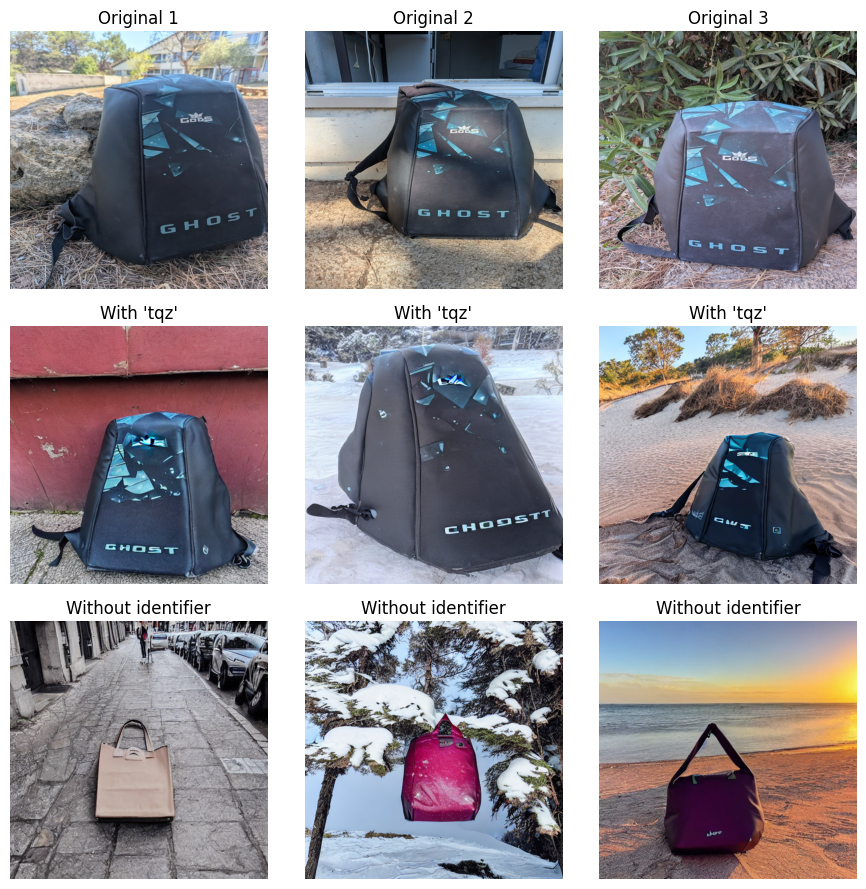

In [ ]:
identifier = "tqz"
base_noun = "bag"
scenarios = [
    f"a {identifier} {base_noun} on a city street",
    f"a {identifier} {base_noun} in the very snowy mountains",
    f"a {identifier} {base_noun} on a beach during sunset"
]

images_with_id = []
images_without_id = []

for prompt in scenarios:
    image = pipe(prompt, num_inference_steps=50, guidance_scale=7.5, height=512, width=512).images[0]
    images_with_id.append(image)

    prompt_without = prompt.replace(f"{identifier} ", "")
    image_plain = pipe(prompt_without, num_inference_steps=50, guidance_scale=7.5, height=512, width=512).images[0]
    images_without_id.append(image_plain)

instance_images = []
for filename in sorted(os.listdir(instance_dir)):
    if filename.lower().endswith((".jpg", ".jpeg", ".png")):
        img = Image.open(os.path.join(instance_dir, filename)).convert("RGB")
        instance_images.append(img)

# Display grid
num_rows = 3
num_cols = max(len(scenarios), len(instance_images)-2)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(3*num_cols, 3*num_rows))

for i in range(num_cols):
    if i < len(instance_images)-2:
        axes[0, i].imshow(instance_images[i])
        axes[0, i].set_title(f"Original {i+1}")
    axes[0, i].axis("off")

for i in range(num_cols):
    if i < len(images_with_id):
        axes[1, i].imshow(images_with_id[i])
        axes[1, i].set_title(f"With '{identifier}'")
    axes[1, i].axis("off")

for i in range(num_cols):
    if i < len(images_without_id):
        axes[2, i].imshow(images_without_id[i])
        axes[2, i].set_title("Without identifier")
    axes[2, i].axis("off")

plt.tight_layout()
plt.show()


The original images in the first row display clear, consistent visuals of the specific bag subject, showcasing distinct features such as the geometric blue pattern and the "GHOST" logo. These images form the ground truth that the model was trained on, providing the visual identity that personalization aims to replicate.

In the second row, images generated with the tqz identifier closely resemble the original bag’s distinctive characteristics. Despite the different environments—urban, snowy landscape, and beach setting—the unique blue pattern and logo remain prominent, demonstrating that the model has successfully learned to preserve the subject’s identity while adapting it to varied scenarios. Some minor artifacts or slight deformations in text or shape appear, which is expected given the few-shot training setup and the inherent challenges in diffusion models, but overall the bag’s essence is well retained.

The third row, showing images generated without the identifier token, reveals the model’s interpretation of the general class "bag" without personalization. These images look visually plausible as bags but lack the distinctive pattern and branding seen in the original and tqz-conditioned images. Instead, they represent more generic and diverse bags placed in similar scenes (urban, snowy, beach). This contrast highlights how the identifier token effectively guides the model to produce subject-specific outputs, and without it, the output is consistent with the broader class distribution learned from the class images.

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:03<00:00, 14.38it/s]


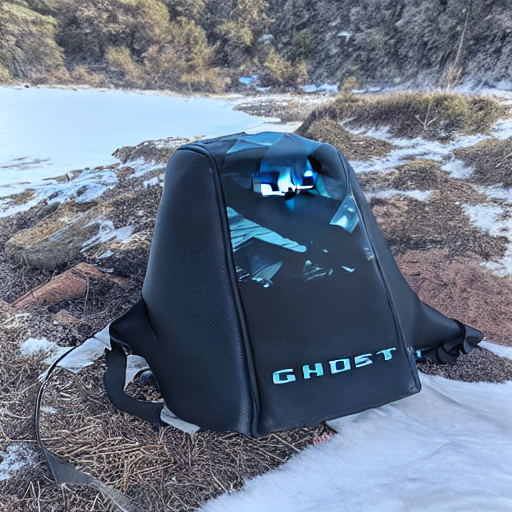

In [ ]:
prompt = "a tqz bag in the snowy mountains"
image = pipe(prompt, num_inference_steps=50, guidance_scale=7.5, height = 512, width = 512).images[0]

display(image)

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:03<00:00, 14.50it/s]


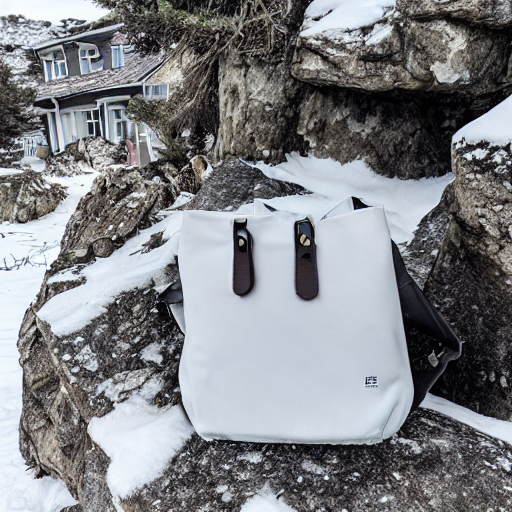

In [ ]:
prompt = "a bag in the snowy mountains"
image = pipe(prompt, num_inference_steps=50, guidance_scale=7.5, height = 512, width = 512).images[0]

display(image)

### Example 2: Subject Dog

In [18]:
import matplotlib.pyplot as plt
from peft import PeftModel
from torchvision.transforms import ToTensor

base_model_id = "runwayml/stable-diffusion-v1-5"
lora_checkpoint = "./output/lora-dreambooth/subject_transfer/dog/checkpoint-300/unet"
instance_dir = "./data/subject/dog/subject_instance_images"

pipe = StableDiffusionPipeline.from_pretrained(
    base_model_id,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")
pipe.unet = PeftModel.from_pretrained(pipe.unet, lora_checkpoint)

Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00,  7.86it/s]
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:03<00:00, 14.31it/s]


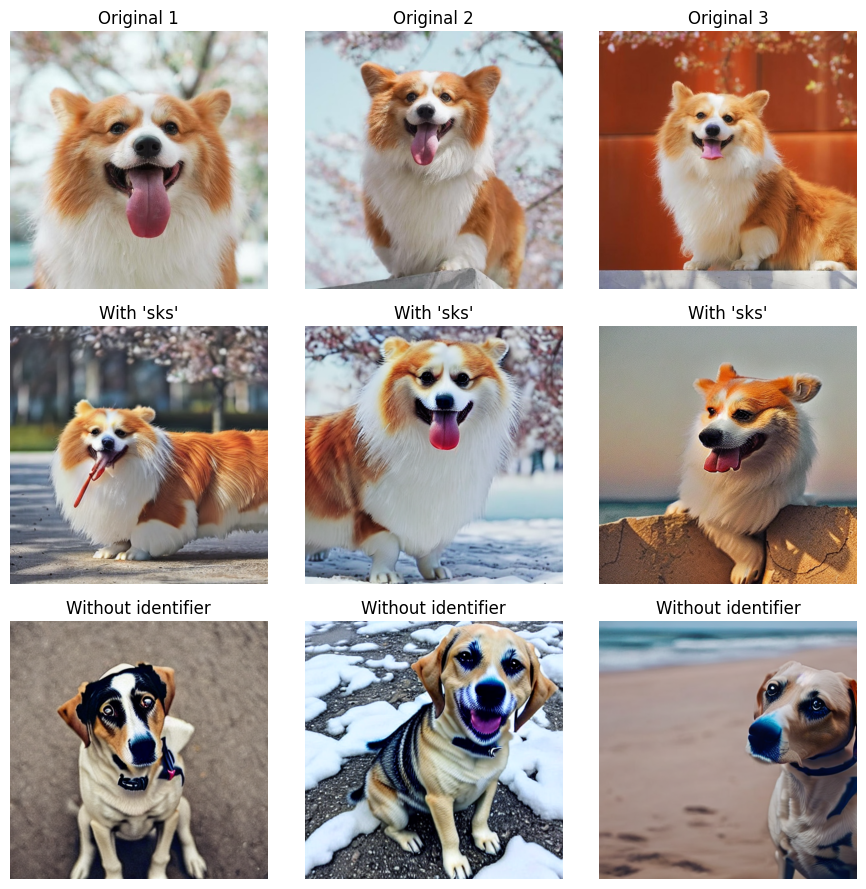

In [19]:
identifier = "sks"
base_noun = "dog"
scenarios = [
    f"a {identifier} {base_noun} on a city street",
    f"a {identifier} {base_noun} in the snowy mountains",
    f"a {identifier} {base_noun} on a beach during sunset"
]

images_with_id = []
images_without_id = []

for prompt in scenarios:
    image = pipe(prompt, num_inference_steps=50, guidance_scale=7.5, height=512, width=512).images[0]
    images_with_id.append(image)

    prompt_without = prompt.replace(f"{identifier} ", "")
    image_plain = pipe(prompt_without, num_inference_steps=50, guidance_scale=7.5, height=512, width=512).images[0]
    images_without_id.append(image_plain)

instance_images = []
for filename in sorted(os.listdir(instance_dir)):
    if filename.lower().endswith((".jpg", ".jpeg", ".png")):
        img = Image.open(os.path.join(instance_dir, filename)).convert("RGB")
        instance_images.append(img)

# Display grid
num_rows = 3
num_cols = max(len(scenarios), len(instance_images)-2)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(3*num_cols, 3*num_rows))

for i in range(num_cols):
    if i < len(instance_images)-2:
        axes[0, i].imshow(instance_images[i])
        axes[0, i].set_title(f"Original {i+1}")
    axes[0, i].axis("off")

for i in range(num_cols):
    if i < len(images_with_id):
        axes[1, i].imshow(images_with_id[i])
        axes[1, i].set_title(f"With '{identifier}'")
    axes[1, i].axis("off")

for i in range(num_cols):
    if i < len(images_without_id):
        axes[2, i].imshow(images_without_id[i])
        axes[2, i].set_title("Without identifier")
    axes[2, i].axis("off")

plt.tight_layout()
plt.show()


For the second example, I used the classic case of a dog as the subject and trained the LoRA weights accordingly. As seen in the generated outputs above, the model effectively captures the visual features of the subject and produces diverse, novel images of the dog across various settings. An important observation during inference was the impact of checkpoint selection on the trade-off between subject fidelity and prompt alignment. The images shown were generated using the checkpoint from step 300, rather than the final checkpoint, because I found that while the final model offered high subject fidelity, it often failed to adhere closely to the prompt—resulting in poor scene composition or missed contextual elements. Conversely, when using an earlier checkpoint, such as step 200, the prompt alignment improved significantly, but the model struggled to preserve the subject's identity accurately. This highlights the importance of evaluating intermediate checkpoints to achieve an optimal balance between maintaining subject fidelity and ensuring the generated output aligns well with the given prompt.

# Implementing Style Transfer with DreamBooth + LoRA

## Preparing the Dataset

In [ ]:
print("Preparing training data...")
prepare_training_data(
        source_dir="./raw_images/style_waterpaint",
        output_dir="./data/style/waterpaint/style_instance_images",
        target_size=512
    )
    
generate_class_images(
        class_prompt="A real photo of forest or sunset scenes",
        output_dir="./data/style/waterpaint/style_class_images",
        num_images=400
    )
    
print("Data preparation completed!")

Preparing training data...
Processed: water_3.jpg
Processed: water_1.jpg
Processed: water_2.jpg
Processed: water_4.jpg


100%|██████████| 50/50 [00:02<00:00, 16.83it/s]


Generated 10/400 class images


100%|██████████| 50/50 [00:03<00:00, 16.39it/s]


Generated 20/400 class images


100%|██████████| 50/50 [00:03<00:00, 16.19it/s]


Generated 30/400 class images


100%|██████████| 50/50 [00:03<00:00, 16.09it/s]


Generated 40/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.99it/s]


Generated 50/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.95it/s]


Generated 60/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.95it/s]


Generated 70/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.93it/s]


Generated 80/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.93it/s]


Generated 90/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.93it/s]


Generated 100/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.93it/s]


Generated 110/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.91it/s]


Generated 120/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.90it/s]


Generated 130/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.89it/s]


Generated 140/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.89it/s]


Generated 150/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.90it/s]


Generated 160/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.89it/s]


Generated 170/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.91it/s]


Generated 180/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.90it/s]


Generated 190/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.92it/s]


Generated 200/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.90it/s]


Generated 210/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.89it/s]


Generated 220/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.90it/s]


Generated 230/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.90it/s]


Generated 240/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.90it/s]


Generated 250/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.88it/s]


Generated 260/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.86it/s]


Generated 270/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.90it/s]


Generated 280/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.89it/s]


Generated 290/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.89it/s]


Generated 300/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.87it/s]


Generated 310/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.89it/s]


Generated 320/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.86it/s]


Generated 330/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.88it/s]


Generated 340/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.89it/s]


Generated 350/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.88it/s]


Generated 360/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.88it/s]


Generated 370/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.88it/s]


Generated 380/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.87it/s]


Generated 390/400 class images


100%|██████████| 50/50 [00:03<00:00, 15.82it/s]


Generated 400/400 class images
Class image generation completed! Saved to ./data/style/waterpaint/style_class_images
Data preparation completed!


## Training

In [ ]:
def main():
    args = parse_args()
    config = vars(args)
    
    if config["validation_prompt"] is None:
        config["validation_prompt"] = config["instance_prompt"]
    
    os.makedirs(config["output_dir"], exist_ok=True)

    with open(os.path.join(config["output_dir"], "training_config.json"), "w") as f:
        json.dump(config, f, indent=2)

    trainer = LoRADreamBoothTrainer(config)
    trainer.train()

### For Style Waterpaint

In [ ]:
import sys

sys.argv = [
    "lora_dreambooth.py",
    "--pretrained_model_name_or_path", "runwayml/stable-diffusion-v1-5",
    "--instance_data_dir", "./data/style/waterpaint/style_instance_images",
    "--class_data_dir", "./data/style/waterpaint/style_class_images",
    "--output_dir", "./output/lora-dreambooth/style_transfer/waterpaint",
    "--instance_prompt", "in the style of pqrstyle",
    "--class_prompt", "A real photo of forest or sunset scenes",
    "--with_prior_preservation",
    "--prior_loss_weight", "1.0",
    "--resolution", "512",
    "--train_batch_size", "1",
    "--gradient_accumulation_steps", "1",
    "--learning_rate", "5e-4",
    "--lr_scheduler", "constant",
    "--lr_warmup_steps", "0",
    "--num_train_epochs", "100",
    "--lora_rank", "64",
    "--lora_alpha", "32",
    "--lora_dropout", "0.0",
    "--validation_prompt", "A dog in the style of pqrstyle",
    "--validation_steps", "100",
    "--checkpointing_steps", "100",
    "--use_8bit_adam",
    "--seed", "42",
    "--enable_xformers"
]

This configuration fine-tunes a Stable Diffusion model using LoRA to capture a new artistic style named `"pqrstyle"`, inspired by waterpaint-style images. Training is performed on style reference images (`instance_data_dir`) with prompts such as `"in the style of pqrstyle"`, enabling the model to learn how to apply this specific visual style across various scenes. A key challenge I faced here was selecting appropriate class images. Unlike subject transfer—where class images naturally correspond to the general noun category—style transfer lacks a single subject and instead involves diverse scenes sharing the same artistic style. To address this, I chose the class images as real, unstyled versions of the scenes depicted in the instance images. For example, if the instance images are waterpaint renditions of mountain landscapes, the class images would be real photographs of mountains. This approach helps the model distinguish between content (the scene) and style (the artistic texture and strokes), ensuring it learns to apply the style without losing the underlying scene semantics.

Using a LoRA rank of 64 and a learning rate of 5e-4 strikes a good balance between training efficiency and model capacity, allowing effective adaptation with a small number of trainable parameters. Training runs for 100 epochs with periodic validation to carefully balance style strength and content preservation. The use of 8-bit Adam optimizer and xFormers accelerates training and reduces memory usage. 

### For Style Warli Art

In [ ]:
import sys

sys.argv = [
    "lora_dreambooth.py",
    "--pretrained_model_name_or_path", "runwayml/stable-diffusion-v1-5",
    "--instance_data_dir", "./data/style/warli/style_instance_images",
    "--class_data_dir", "./data/style/warli/style_class_images",
    "--output_dir", "./output/lora-dreambooth/style_transfer/warli",
    "--instance_prompt", "in the style of xyzstyle",
    "--class_prompt", "a photo of tribal scenes",
    "--with_prior_preservation",
    "--prior_loss_weight", "1.0",
    "--resolution", "512",
    "--train_batch_size", "1",
    "--gradient_accumulation_steps", "1",
    "--learning_rate", "5e-4",
    "--lr_scheduler", "constant",
    "--lr_warmup_steps", "0",
    "--num_train_epochs", "100",
    "--lora_rank", "64",
    "--lora_alpha", "32",
    "--lora_dropout", "0.0",
    "--validation_prompt", "a photo of a dog in the style of xyzstyle",
    "--validation_steps", "100",
    "--checkpointing_steps", "100",
    "--use_8bit_adam",
    "--seed", "42",
    "--enable_xformers"
]

### Training

In [75]:
main()

08/23/2025 17:04:15 - INFO - __main__ - Loading pretrained models...
08/23/2025 17:04:18 - INFO - __main__ - Setting up LoRA...
08/23/2025 17:04:18 - INFO - __main__ - Setting up dataset...
08/23/2025 17:04:18 - INFO - __main__ - Setting up training...
08/23/2025 17:04:18 - INFO - __main__ - Using 8-bit Adam optimizer (AdamW8bit).
08/23/2025 17:04:24 - INFO - __main__ - Enabled xFormers memory-efficient attention.
08/23/2025 17:04:24 - INFO - __main__ - Starting training...
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 79.56it/s]
08/23/2025 17:07:10 - INFO - __main__ - Saved checkpoint to ./output/lora-dreambooth/style_transfer/waterpaint/checkpoint-100
08/23/2025 17:07:10 - INFO - __main__ - Epoch 24 completed. Average loss: 0.5493
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 77.65it/s]
08/23/2025 17:09:59 - INFO - __main__ - Saved checkpoint to ./output/lora-dreambooth/style_transfer/waterpaint/checkpoint-200
08/23/2025 17:09:59 - INFO - __m

## Inference

### Example 1: Style Waterpaint

In [52]:
import matplotlib.pyplot as plt
from peft import PeftModel
from torchvision.transforms import ToTensor

# Paths and model loading
base_model_id = "runwayml/stable-diffusion-v1-5"
lora_checkpoint = "./output/lora-dreambooth/style_transfer/waterpaint/checkpoint-final/unet"
instance_dir = "./data/style/waterpaint/style_instance_images"

pipe = StableDiffusionPipeline.from_pretrained(
    base_model_id,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")
pipe.unet = PeftModel.from_pretrained(pipe.unet, lora_checkpoint)

Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00,  7.68it/s]
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:03<00:00, 14.52it/s]


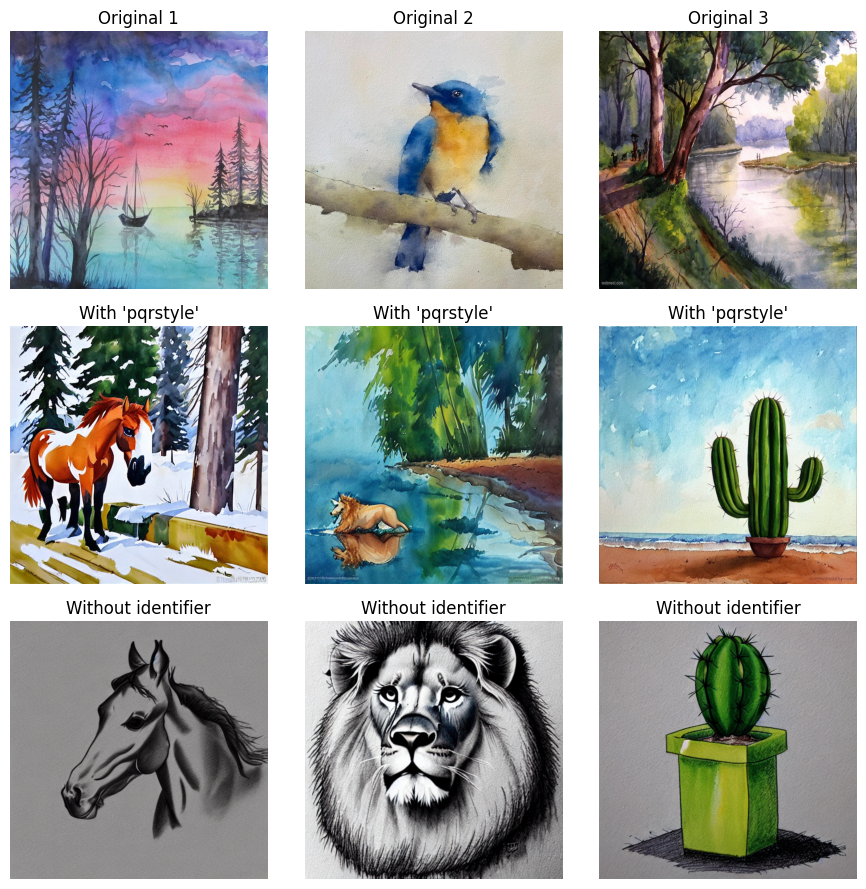

In [23]:
identifier = "pqrstyle"
base_noun = "in the style of"
scenarios = [
    f"a horse {base_noun} {identifier} on a snowy mountain",
    f"a lion {base_noun} {identifier} swimming in the ocean",
    f"a cactus {base_noun} {identifier} on a beach"
]

images_with_id = []
images_without_id = []

for prompt in scenarios:
    image = pipe(prompt, num_inference_steps=50, guidance_scale=7.5, height=512, width=512).images[0]
    images_with_id.append(image)

    prompt_without = prompt.replace(f"{identifier} ", "pencil sketch")
    image_plain = pipe(prompt_without, num_inference_steps=50, guidance_scale=7.5, height=512, width=512).images[0]
    images_without_id.append(image_plain)

instance_images = []
for filename in sorted(os.listdir(instance_dir)):
    if filename.lower().endswith((".jpg", ".jpeg", ".png")):
        img = Image.open(os.path.join(instance_dir, filename)).convert("RGB")
        instance_images.append(img)

# Display grid
num_rows = 3
num_cols = max(len(scenarios), len(instance_images)-1)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(3*num_cols, 3*num_rows))

for i in range(num_cols):
    if i < len(instance_images)-1:
        axes[0, i].imshow(instance_images[i])
        axes[0, i].set_title(f"Original {i+1}")
    axes[0, i].axis("off")

for i in range(num_cols):
    if i < len(images_with_id):
        axes[1, i].imshow(images_with_id[i])
        axes[1, i].set_title(f"With '{identifier}'")
    axes[1, i].axis("off")

for i in range(num_cols):
    if i < len(images_without_id):
        axes[2, i].imshow(images_without_id[i])
        axes[2, i].set_title("Without identifier")
    axes[2, i].axis("off")

plt.tight_layout()
plt.show()


The results demonstrate that the model has successfully learned to apply the `"pqrstyle"` waterpaint aesthetic to a variety of scenes and objects. The middle row, generated using prompts that include the identifier token `"pqrstyle"`, shows strong stylistic consistency with the original reference images in the top row. The outputs exhibit key characteristics of waterpaint, such as soft brush strokes, blended colors, and a hand-painted texture, regardless of the subject matter (e.g., horse, lion, cactus). This indicates that the model has internalized the stylistic features rather than memorizing specific content.

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:03<00:00, 14.82it/s]


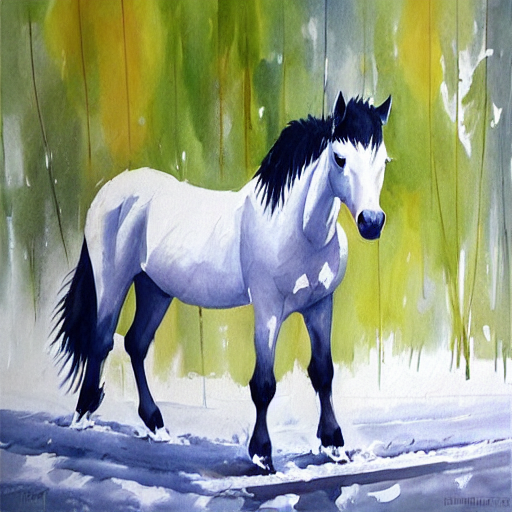

In [53]:
prompt = "a horse in snow in the style of pqrstyle"
image = pipe(prompt, num_inference_steps=50, guidance_scale=7.5, height = 512, width = 512).images[0]

display(image)

### Example 2: Style Warli

In [38]:
# Paths and model loading
base_model_id = "runwayml/stable-diffusion-v1-5"
lora_checkpoint = "./output/lora-dreambooth/style_transfer/warli/checkpoint-final/unet"
instance_dir = "./data/style/warli/style_instance_images"

pipe = StableDiffusionPipeline.from_pretrained(
    base_model_id,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")
pipe.unet = PeftModel.from_pretrained(pipe.unet, lora_checkpoint)

Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 11.25it/s]
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


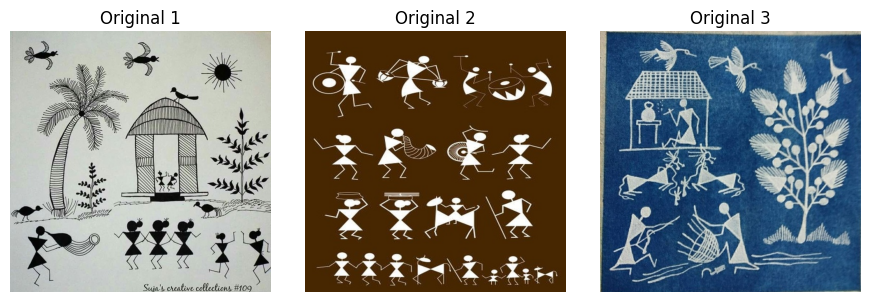

In [48]:
instance_images = []
for filename in sorted(os.listdir(instance_dir)):
    if filename.lower().endswith((".jpg", ".jpeg", ".png")):
        img = Image.open(os.path.join(instance_dir, filename)).convert("RGB")
        instance_images.append(img)

num_cols = min(3, len(instance_images)) 
fig, axes = plt.subplots(1, num_cols, figsize=(3 * num_cols, 3))

if num_cols == 1:
    axes = [axes]

for i in range(num_cols):
    axes[i].imshow(instance_images[i])
    axes[i].set_title(f"Original {i+1}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()


#### Target Style

100%|██████████| 50/50 [00:03<00:00, 14.56it/s]


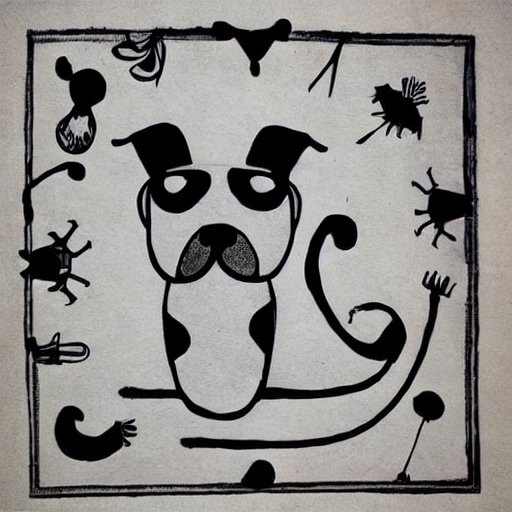

In [ ]:
prompt = "a dog in the style of xyzstyle"
image = pipe(prompt, num_inference_steps=50, guidance_scale=7.5, height = 512, width = 512).images[0]

display(image)

  6%|▌         | 3/50 [00:00<00:03, 12.00it/s]

100%|██████████| 50/50 [00:03<00:00, 14.72it/s]


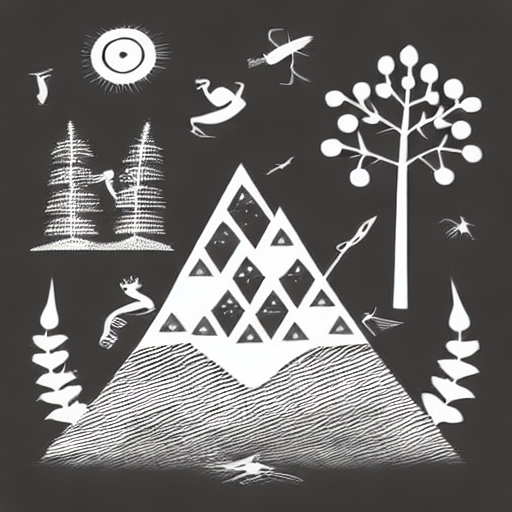

In [ ]:
prompt = "a mountain in the style of xyzstyle"
image = pipe(prompt, num_inference_steps=50, guidance_scale=7.5, height = 512, width = 512).images[0]

display(image)

#### Other Styles

100%|██████████| 50/50 [00:03<00:00, 14.71it/s]


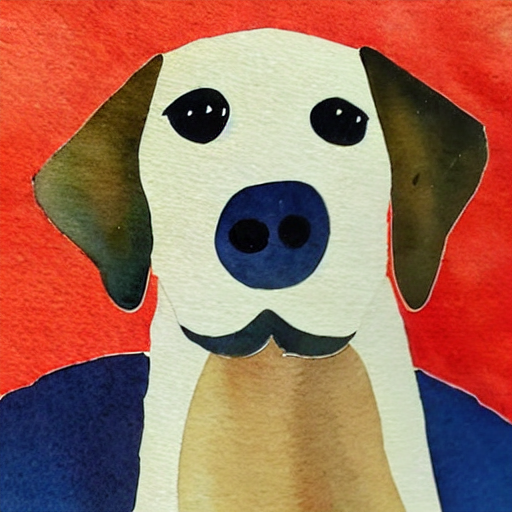

In [50]:
prompt = "a dog in the style of watercolor painting"
image = pipe(prompt, num_inference_steps=50, guidance_scale=7.5, height = 512, width = 512).images[0]

display(image)

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:03<00:00, 14.69it/s]


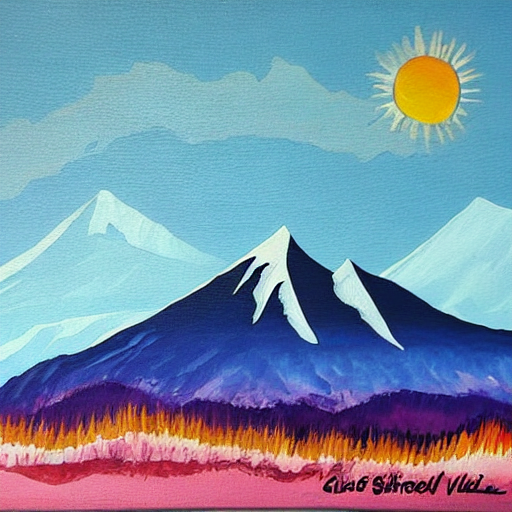

In [49]:
# Run inference
prompt = "a mountain in the style of acrylic painting"
image = pipe(prompt, num_inference_steps=50, guidance_scale=7.5, height = 512, width = 512).images[0]

display(image)

Similar results are observed for the second art style which I finetuned the model on (Warli Art Style). The model is able to capture the fact that the art style in the instance images is made up geometric patterns and consequently these patterns can be observed in the generated images.

# Implementing Subject + Style Transfer using ZipLoRA

## ZipLoRA: Merging Subject and Style LoRAs Effectively

In this section, I implement **ZipLoRA**, an efficient algorithm to generate images of any user-defined subject in any user-defined style.

**ZipLoRA** is a technique designed to seamlessly combine two independently trained LoRA (Low-Rank Adaptation) modules—one for a **subject** and the other for a **style**—into a single module that can stylize the subject using the desired artistic appearance.

### LoRA Recap

LoRA assumes that the weight update to a base model's weight matrix $W_0 \in \mathbb{R}^{m \times n}$ during fine-tuning can be approximated by a low-rank product:

$$
\Delta W = BA
$$

where $B \in \mathbb{R}^{m \times r}$ and $A \in \mathbb{R}^{r \times n}$, and $r \ll \min(m, n)$. This greatly reduces the number of trainable parameters, making it efficient for adapting large models such as diffusion models.

### The Problem

Given:

- A subject LoRA: $L_c = \Delta W_c$
- A style LoRA: $L_s = \Delta W_s$

A naïve merge would compute:

$$
\Delta W_m = w_c \cdot \Delta W_c + w_s \cdot \Delta W_s
$$

where $w_c$ and $w_s$ are scalar weights. However, this **direct merge** can result in **interference**, especially when the two LoRA matrices have **highly aligned** columns (i.e., non-orthogonal).

### ZipLoRA's Insights

#### 1. **LoRA updates are sparse**

Most values in $\Delta W$ have very small magnitudes and minimal impact. These can be pruned without harming performance.

#### 2. **Interference comes from aligned columns**

If columns of $\Delta W_c$ and $\Delta W_s$ are not orthogonal (i.e., they have high cosine similarity), direct addition leads to **signal interference**, degrading the model’s ability to render either the subject or the style accurately.

### ZipLoRA Solution

ZipLoRA introduces **learnable coefficient vectors** $m_c$ and $m_s$ for each layer. These vectors are used to selectively scale the columns of the subject and style LoRA matrices:

$$
\Delta W_m = m_c \otimes \Delta W_c + m_s \otimes \Delta W_s
$$

where $\otimes$ denotes **column-wise (element-wise) multiplication**.

This enables ZipLoRA to:

- Emphasize non-conflicting information  
- Suppress interfering components

### Optimization Objective

ZipLoRA learns $m_c$ and $m_s$ by optimizing the following **loss function**:

$$
\mathcal{L}_{\text{merge}} = \| (D \oplus L_m)(x_c, p_c) - (D \oplus L_c)(x_c, p_c) \|^2 + \| (D \oplus L_m)(x_s, p_s) - (D \oplus L_s)(x_s, p_s) \|^2 + \lambda \sum_i \left| m_c^{(i)} \cdot m_s^{(i)} \right|
$$

Where:

- $D$: base diffusion model  
- $L_m$: merged LoRA  
- $x_c, x_s$: sample images for content (subject) and style  
- $p_c, p_s$: their corresponding prompts  
- $\lambda$: weighting factor for the orthogonality penalty

The three terms respectively:

1. Preserve **subject generation** ability  
2. Preserve **style generation** ability  
3. Enforce **orthogonality** between merged columns to reduce interference

### Efficiency

A key benefit of ZipLoRA is that it:

- **Freezes** both the base model and the original LoRA weights  
- Only **optimizes merger coefficients** ($m_c$, $m_s$)  
- Requires **~100 gradient steps**, making it **10× faster** than joint fine-tuning


## Necessary packages

In [10]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
os.environ["OMP_NUM_THREADS"] = "8"
os.environ["MKL_NUM_THREADS"] = "8"
os.environ["NUMEXPR_NUM_THREADS"] = "8"
os.environ["OPENBLAS_NUM_THREADS"] = "8"

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import AdamW
import numpy as np
from safetensors import safe_open
from diffusers import StableDiffusionPipeline, DDPMScheduler
from transformers import CLIPTokenizer, CLIPTextModel
from typing import Dict, List, Optional, Tuple
from dataclasses import dataclass

## ZipLoRA Implementation

### ZipLoRAConfig and ZipLoRALayer: Core Setup and Innovation

`ZipLoRALayer` class:

* **Concept Encoders & Shared Latent Space:**
  Unlike conventional LoRA which directly learns low-rank updates, ZipLoRA maps each independently trained LoRA concept (e.g., subject and style) into a **shared latent space** through dedicated concept encoders. Each concept’s LoRA parameters are passed through a small neural network that transforms them into this common latent representation. This shared latent space facilitates **disentangled representations** and enables more flexible combination and interpolation of different concepts.

* **Dynamic Reconstruction of LoRA Weights:**
  The combined latent representation (a weighted sum of the individual concept latents, where weights correspond to how much each concept should contribute) is then projected back to LoRA weight matrices via learnable linear layers. Instead of directly summing the LoRA weight updates, ZipLoRA generates **dynamic, input-dependent LoRA weights** that capture the desired blend of concepts in a continuous manner.

* **Forward Pass Logic:**
  The forward pass takes an input tensor and a set of concept weights (e.g., relative emphasis on subject vs. style). It encodes each concept’s LoRA parameters to the latent space, combines them with these weights, reconstructs new LoRA matrices dynamically, and applies the adapted low-rank transformation to the input. This allows smooth blending of concepts at the weight level, providing finer control over the generated images.

* **Orthogonality Loss:**
  To encourage the model to keep the concepts distinct and avoid interference, the code computes an orthogonality loss by measuring cosine similarity between latent vectors of different concepts and penalizing similarity. This regularization encourages disentanglement so that subject and style information don’t conflict when merged.

### Integration Into the Base Model: ZipLoRAModel

* **Injecting ZipLoRA Layers:**
  The `ZipLoRAModel` wraps around an existing diffusion model and injects `ZipLoRALayer` modules into all relevant attention layers (queries, keys, values, and output projections). These layers operate in parallel with the original weights, allowing ZipLoRA to modulate the model’s behavior without changing the original parameters.

* **Loading Pretrained LoRA Weights:**
  To leverage existing subject and style LoRA modules, ZipLoRA loads their pretrained weights into its own concept-specific LoRA parameters. This lets the method build on previous work and fine-tune or blend models efficiently.

* **Forward Pass with Monkey Patching:**
  The forward method temporarily patches the base model’s attention layers to include the ZipLoRA transformations during inference. It intercepts the layer outputs and adds the dynamically generated ZipLoRA updates on top of the base output, effectively merging the learned subject and style adaptations on-the-fly.



In [93]:
@dataclass
class ZipLoRAConfig:
    """Configuration for ZipLoRA training"""
    rank: int = 16  # LoRA rank
    alpha: int = 32  # LoRA alpha
    latent_dim: int = 64  # Shared latent space dimension
    num_concepts: int = 2  # Number of concepts (subject + style)
    learning_rate: float = 1e-4
    num_train_epochs: int = 1000
    lambda_orthogonal: float = 0.1  # Orthogonality loss weight
    lambda_sparsity: float = 0.01   # Sparsity loss weight

class ZipLoRALayer(nn.Module):
       
    def __init__(self, in_features: int, out_features: int, config: ZipLoRAConfig):
        super().__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.rank = config.rank
        self.alpha = config.alpha
        self.latent_dim = config.latent_dim
        self.num_concepts = config.num_concepts
        
        self.concept_encoders = nn.ModuleList([
            nn.Sequential(
                nn.Linear(self.rank, self.latent_dim),
                nn.ReLU(),
                nn.Linear(self.latent_dim, self.latent_dim)
            ) for _ in range(self.num_concepts)
        ])
        
        self.latent_to_lora_A = nn.Linear(self.latent_dim, self.rank * in_features)
        self.latent_to_lora_B = nn.Linear(self.latent_dim, out_features * self.rank)
        
        self.lora_A = nn.Parameter(torch.randn(self.num_concepts, self.rank, in_features))
        self.lora_B = nn.Parameter(torch.randn(self.num_concepts, out_features, self.rank))
        
        self.scaling = self.alpha / self.rank
        
        self._initialize_weights()
    
    def _initialize_weights(self):
        """Initialize weights following ZipLoRA methodology"""
        for encoder in self.concept_encoders:
            for layer in encoder:
                if isinstance(layer, nn.Linear):
                    nn.init.kaiming_normal_(layer.weight)
                    nn.init.zeros_(layer.bias)
        
        nn.init.kaiming_normal_(self.latent_to_lora_A.weight)
        nn.init.kaiming_normal_(self.latent_to_lora_B.weight)
        nn.init.zeros_(self.latent_to_lora_A.bias)
        nn.init.zeros_(self.latent_to_lora_B.bias)
        
        nn.init.kaiming_uniform_(self.lora_A, a=np.sqrt(5))
        nn.init.zeros_(self.lora_B)
    
    def load_pretrained_lora_weights(self, subject_weights: Dict, style_weights: Dict, layer_name: str):
        """
        Load pretrained LoRA weights from the existing DreamBooth + LoRA models
        
        Args:
            subject_weights: Dictionary containing subject LoRA weights
            style_weights: Dictionary containing style LoRA weights  
            layer_name: Name of the current layer
        """
        # Load subject weights (concept 0)
        if f"{layer_name}.lora_down.weight" in subject_weights:
            self.lora_A.data[0] = subject_weights[f"{layer_name}.lora_down.weight"]
        if f"{layer_name}.lora_up.weight" in subject_weights:
            self.lora_B.data[0] = subject_weights[f"{layer_name}.lora_up.weight"]
            
        # Load style weights (concept 1)  
        if f"{layer_name}.lora_down.weight" in style_weights:
            self.lora_A.data[1] = style_weights[f"{layer_name}.lora_down.weight"]
        if f"{layer_name}.lora_up.weight" in style_weights:
            self.lora_B.data[1] = style_weights[f"{layer_name}.lora_up.weight"]
    
    def forward(self, x: torch.Tensor, concept_weights: torch.Tensor) -> torch.Tensor:
        """
        Forward pass implementing ZipLoRA's main concept
        
        Args:
            x: Input tensor
            concept_weights: Weights for each concept [batch_size, num_concepts]
        """
        batch_size = x.size(0)
        
        # Encode each concept to shared latent space
        concept_latents = []
        for i, encoder in enumerate(self.concept_encoders):
            # Use the LoRA weights as input to concept encoder
            lora_features = torch.flatten(self.lora_A[i]).unsqueeze(0).repeat(batch_size, 1)
            latent = encoder(lora_features[:, :self.rank])  # Take first 'rank' dimensions
            concept_latents.append(latent)
        
        # Weighted combination of concept latents
        concept_latents = torch.stack(concept_latents, dim=1)  # [batch, num_concepts, latent_dim]
        combined_latent = torch.sum(
            concept_latents * concept_weights.unsqueeze(-1), dim=1
        )  # [batch, latent_dim]
        
        # Generate LoRA weights from combined latent representation
        dynamic_A = self.latent_to_lora_A(combined_latent).view(
            batch_size, self.rank, self.in_features
        )
        dynamic_B = self.latent_to_lora_B(combined_latent).view(
            batch_size, self.out_features, self.rank
        )
        
        lora_output = torch.bmm(
            torch.bmm(dynamic_B, dynamic_A), 
            x.unsqueeze(-1)
        ).squeeze(-1)
        
        return lora_output * self.scaling
    
    def get_orthogonality_loss(self) -> torch.Tensor:
        """
        Compute orthogonality loss to ensure concept disentanglement
        This is a key component of ZipLoRA training
        """
        loss = 0
        for i in range(self.num_concepts):
            for j in range(i + 1, self.num_concepts):
                # Compute cosine similarity between concept latent spaces
                latent_i = torch.flatten(self.lora_A[i])[:self.latent_dim]
                latent_j = torch.flatten(self.lora_A[j])[:self.latent_dim]
                
                cosine_sim = F.cosine_similarity(latent_i, latent_j, dim=0)
                loss += torch.abs(cosine_sim)  # Encourage orthogonality
        
        return loss / (self.num_concepts * (self.num_concepts - 1) / 2)

class ZipLoRAModel(nn.Module):
    """
    Complete ZipLoRA model that wraps around the existing diffusion model
    """
    
    def __init__(self, base_model, config: ZipLoRAConfig):
        super().__init__()
        self.base_model = base_model
        self.config = config
        self.ziplora_layers = nn.ModuleDict()
        
        # Add ZipLoRA layers to attention modules
        self._inject_ziplora_layers()
    
    def __getattr__(self, name):
        """Delegate attribute access to the base model"""
        try:
            return super().__getattr__(name)
        except AttributeError:
            # If attribute not found in ZipLoRAModel, look in base_model
            return getattr(self.base_model, name)
        
    def _inject_ziplora_layers(self):
        """Inject ZipLoRA layers into the base model"""
        for name, module in self.base_model.named_modules():
            if 'attn' in name and hasattr(module, 'to_q'):
                # Add ZipLoRA to query, key, value projections
                for proj_name in ['to_q', 'to_k', 'to_v', 'to_out']:
                    if hasattr(module, proj_name):
                        proj_layer = getattr(module, proj_name)
                        if hasattr(proj_layer, 'weight'):
                            in_features = proj_layer.weight.shape[1]
                            out_features = proj_layer.weight.shape[0]
                            
                            ziplora_layer = ZipLoRALayer(
                                in_features, out_features, self.config
                            )
                            layer_key = f"{name}.{proj_name}".replace(".", "_")
                            self.ziplora_layers[layer_key] = ziplora_layer
    
    def load_pretrained_weights(self, subject_lora_path: str, style_lora_path: str):
        """
        Load your existing LoRA weights into ZipLoRA
        """
        # Load subject LoRA weights
        subject_weights = {}
        with safe_open(subject_lora_path, framework="pt", device="cpu") as f:
            for key in f.keys():
                subject_weights[key] = f.get_tensor(key)
        
        # Load style LoRA weights  
        style_weights = {}
        with safe_open(style_lora_path, framework="pt", device="cpu") as f:
            for key in f.keys():
                style_weights[key] = f.get_tensor(key)
        
        # Load weights into ZipLoRA layers
        for layer_name, ziplora_layer in self.ziplora_layers.items():
            original_layer_name = layer_name.replace("_", ".")
            ziplora_layer.load_pretrained_lora_weights(
                subject_weights, style_weights, original_layer_name
            )
    
    def forward(self, x, concept_weights, timestep=None, encoder_hidden_states=None):
        """Forward pass with ZipLoRA applied"""
        # Store original forward method
        original_forward = self.base_model.forward
        
        # Create a mapping from underscore keys back to original module names
        layer_mapping = {}
        for underscore_key, ziplora_layer in self.ziplora_layers.items():
            original_key = underscore_key.replace("_", ".")
            layer_mapping[original_key] = ziplora_layer
        
        # Monkey patch to apply ZipLoRA
        def ziplora_forward(*args, **kwargs):
            # Apply ZipLoRA transformations during forward pass
            for name, module in self.base_model.named_modules():
                if name in layer_mapping:
                    original_forward_method = module.forward
                    
                    def wrapped_forward(input_tensor):
                        base_output = original_forward_method(input_tensor)
                        ziplora_output = layer_mapping[name](input_tensor, concept_weights)
                        return base_output + ziplora_output
                    
                    module.forward = wrapped_forward
            
            return original_forward(*args, **kwargs)
        
        return ziplora_forward(x, timestep=timestep, encoder_hidden_states=encoder_hidden_states)


## Changes in the previous classes

In [84]:
class ZipLoRADreamBoothDataset(DreamBoothDataset):
    """
    Extended dataset class for ZipLoRA training
    Reuses the existing DreamBoothDataset but adds concept labels
    """
    
    def __init__(self, subject_data_root, style_data_root, subject_prompt, style_prompt, **kwargs):
        # Initialize with subject data first
        super().__init__(
            instance_data_root=subject_data_root,
            instance_prompt=subject_prompt,
            **kwargs
        )
        
        # Add style data
        self.style_data_root = Path(style_data_root) if style_data_root else None
        self.style_prompt = style_prompt
        
        if self.style_data_root and self.style_data_root.exists():
            self.style_images_path = list(self.style_data_root.iterdir())
        else:
            self.style_images_path = []
    
    def __getitem__(self, index):
        example = super().__getitem__(index)  # Get your existing data
        
        # Add concept information for ZipLoRA
        # Randomly sample whether this batch focuses on subject or style
        import random
        concept_type = random.choice(['both', 'subject', 'style'])
        
        if concept_type == 'subject':
            example['concept_weights'] = [1.0, 0.0]  # 100% subject, 0% style
        elif concept_type == 'style':
            example['concept_weights'] = [0.0, 1.0]  # 0% subject, 100% style
        else:  # both
            # Random mixing ratios
            subject_weight = random.uniform(0.2, 0.7)
            style_weight = 1.0 - subject_weight
            example['concept_weights'] = [subject_weight, style_weight]
        
        # Add style image if available
        if self.style_images_path and concept_type in ['style', 'both']:
            style_image = Image.open(self.style_images_path[index % len(self.style_images_path)])
            if not style_image.mode == "RGB":
                style_image = style_image.convert("RGB")
            example["style_images"] = self.image_transforms(style_image)
            
            example["style_prompt_ids"] = self.tokenizer(
                self.style_prompt,
                padding="do_not_pad",
                truncation=True,
                max_length=self.tokenizer.model_max_length,
            ).input_ids
        
        return example

def ziplora_collate_fn(examples, with_prior_preservation=False):
    """Modified collate function for ZipLoRA"""
    # Use the existing collate function as base
    batch = collate_fn(examples, with_prior_preservation)
    
    # Add concept weights
    concept_weights = torch.tensor([ex["concept_weights"] for ex in examples])
    batch["concept_weights"] = concept_weights
    
    # Add style data if present
    if "style_images" in examples[0]:
        style_pixel_values = [ex.get("style_images") for ex in examples if "style_images" in ex]
        if style_pixel_values:
            batch["style_pixel_values"] = torch.stack(style_pixel_values)
    
    return batch

class ZipLoRADreamBoothTrainer(LoRADreamBoothTrainer):
    """
    Extended trainer that uses ZipLoRA instead of regular LoRA
    """
    
    def setup_lora(self):
        """Setup ZipLoRA instead of regular LoRA"""
        self.logger.info("Setting up ZipLoRA...")
        
        # ZipLoRA config
        ziplora_config = ZipLoRAConfig(
            rank=self.config["lora_rank"],
            alpha=self.config["lora_alpha"],
            latent_dim=64,
            num_concepts=2,  # Subject + Style
            learning_rate=self.config["learning_rate"],
            lambda_orthogonal=0.1,
            lambda_sparsity=0.01
        )
        
        # Replace UNet with ZipLoRA model
        self.ziplora_model = ZipLoRAModel(self.unet, ziplora_config)
        
        # Load your existing LoRA weights
        subject_lora_path = self.config.get("subject_lora_path")
        style_lora_path = self.config.get("style_lora_path")
        
        if subject_lora_path and style_lora_path:
            self.ziplora_model.load_pretrained_weights(subject_lora_path, style_lora_path)
            self.logger.info("Loaded pretrained LoRA weights into ZipLoRA")
    
    def setup_data(self):
        """Setup ZipLoRA dataset"""
        self.logger.info("Setting up ZipLoRA dataset...")
        
        self.train_dataset = ZipLoRADreamBoothDataset(
            subject_data_root=self.config["instance_data_dir"],
            style_data_root=self.config.get("style_data_dir"), 
            subject_prompt=self.config["instance_prompt"],
            style_prompt=self.config.get("style_prompt"), 
            class_data_root=self.config["class_data_dir"],
            class_prompt=self.config["class_prompt"],
            tokenizer=self.tokenizer,
            size=self.config["resolution"],
            center_crop=self.config["center_crop"],
        )

        def ziplora_collate_fn_wrapper(examples):
            return ziplora_collate_fn(examples, self.config["with_prior_preservation"])

        self.train_dataloader = DataLoader(
            self.train_dataset,
            batch_size=self.config["train_batch_size"],
            shuffle=True,
            collate_fn=ziplora_collate_fn_wrapper,
            num_workers=self.config["dataloader_num_workers"],
        )
    
    def train_step(self, batch):
        """Modified training step for ZipLoRA"""
        with self.accelerator.accumulate(self.ziplora_model):
            # Your existing diffusion training logic
            latents = self.vae.encode(batch["pixel_values"].to(dtype=self.vae.dtype)).latent_dist.sample()
            latents = latents * self.vae.config.scaling_factor

            noise = torch.randn_like(latents)
            bsz = latents.shape[0]
            timesteps = torch.randint(
                0, self.noise_scheduler.config.num_train_timesteps, (bsz,), device=latents.device
            )
            timesteps = timesteps.long()

            noisy_latents = self.noise_scheduler.add_noise(latents, noise, timesteps)
            encoder_hidden_states = self.encode_prompt(batch["input_ids"])

            # =====  ZIPLORA FORWARD PASS =====
            # Pass concept weights to the model
            model_pred = self.ziplora_model(
                noisy_latents, 
                concept_weights=batch["concept_weights"],  # KEY: Pass concept weights
                timestep=timesteps,
                encoder_hidden_states=encoder_hidden_states
            ).sample
            # ===== END ZIPLORA FORWARD PASS =====

            # Standard diffusion loss
            loss = F.mse_loss(model_pred.float(), noise.float(), reduction="mean")

            # ===== ZIPLORA SPECIFIC LOSSES =====
            # Orthogonality loss for concept disentanglement
            orthogonal_loss = 0
            for ziplora_layer in self.ziplora_model.ziplora_layers.values():
                orthogonal_loss += ziplora_layer.get_orthogonality_loss()
            orthogonal_loss /= len(self.ziplora_model.ziplora_layers)

            # Add sparsity loss
            sparsity_loss = 0
            for param in self.ziplora_model.parameters():
                if param.requires_grad:
                    sparsity_loss += torch.mean(torch.abs(param))

            # Total loss with ZipLoRA components
            total_loss = (
                loss + 
                0.1 * orthogonal_loss +  # λ_orthogonal
                0.01 * sparsity_loss     # λ_sparsity
            )
            # ===== END ZIPLORA LOSSES =====

            self.accelerator.backward(total_loss)
            
            if self.accelerator.sync_gradients:
                # Clip gradients for ZipLoRA parameters
                params_to_clip = list(self.ziplora_model.parameters())
                self.accelerator.clip_grad_norm_(params_to_clip, self.config["max_grad_norm"])

            self.optimizer.step()
            self.lr_scheduler.step()
            self.optimizer.zero_grad(set_to_none=True)

        return total_loss.detach().item()

## Parser Arguments

In [13]:
def parse_args():
    """Parse command line arguments"""
    parser = argparse.ArgumentParser(description="Train LoRA DreamBooth model")
    
    # Model arguments
    parser.add_argument(
        "--pretrained_model_name_or_path",
        type=str,
        default="runwayml/stable-diffusion-v1-5",
        help="Path to pretrained model or model identifier from huggingface.co/models.",
    )
    
    # Data arguments
    parser.add_argument(
        "--instance_data_dir",
        type=str,
        required=True,
        help="A folder containing the training data of instance images.",
    )
    parser.add_argument(
        "--class_data_dir",
        type=str,
        default=None,
        help="A folder containing the training data of class images.",
    )
    parser.add_argument(
        "--instance_prompt",
        type=str,
        required=True,
        help="The prompt with identifier specifying the instance",
    )
    parser.add_argument(
        "--class_prompt",
        type=str,
        default=None,
        help="The prompt to specify images in the same class as provided instance images.",
    )
    parser.add_argument(
        "--with_prior_preservation",
        default=False,
        action="store_true",
        help="Flag to add prior preservation loss.",
    )
    parser.add_argument(
        "--prior_loss_weight",
        type=float,
        default=1.0,
        help="The weight of prior preservation loss.",
    )
    parser.add_argument(
        "--validation_prompt",
        type=str,
        default=None,
        help="A prompt that is used during validation to verify that the model is learning.",
    )
    parser.add_argument(
        "--num_validation_images",
        type=int,
        default=4,
        help="Number of images that should be generated during validation with `validation_prompt`.",
    )
    
    # Training arguments
    parser.add_argument(
        "--output_dir",
        type=str,
        default="lora-dreambooth-model",
        help="The output directory where the model predictions and checkpoints will be written.",
    )
    parser.add_argument("--seed", type=int, default=None, help="A seed for reproducible training.")
    parser.add_argument(
        "--resolution",
        type=int,
        default=512,
        help="The resolution for input images, all the images in the train/validation dataset will be resized to this resolution",
    )
    parser.add_argument(
        "--center_crop",
        default=False,
        action="store_true",
        help="Whether to center crop the input images to the resolution. If not set, the images will be randomly cropped.",
    )
    parser.add_argument(
        "--train_text_encoder",
        action="store_true",
        help="Whether to train the text encoder. If set, the text encoder should be float32 precision.",
    )
    parser.add_argument(
        "--train_batch_size", type=int, default=1, help="Batch size (per device) for the training dataloader."
    )
    parser.add_argument("--num_train_epochs", type=int, default=1)
    parser.add_argument(
        "--max_train_steps",
        type=int,
        default=None,
        help="Total number of training steps to perform.  If provided, overrides num_train_epochs.",
    )
    parser.add_argument(
        "--checkpointing_steps",
        type=int,
        default=500,
        help="Save a checkpoint of the training state every X updates",
    )
    parser.add_argument(
        "--gradient_accumulation_steps",
        type=int,
        default=1,
        help="Number of updates steps to accumulate before performing a backward/update pass.",
    )
    parser.add_argument(
        "--gradient_checkpointing",
        action="store_true",
        help="Whether or not to use gradient checkpointing to save memory at the expense of slower backward pass.",
    )
    parser.add_argument(
        "--learning_rate",
        type=float,
        default=5e-4,
        help="Initial learning rate (after the potential warmup period) to use.",
    )
    parser.add_argument(
        "--lr_scheduler",
        type=str,
        default="constant",
        help='The scheduler type to use. Choose between ["linear", "cosine", "cosine_with_restarts", "polynomial", "constant", "constant_with_warmup"]',
    )
    parser.add_argument(
        "--lr_warmup_steps", type=int, default=500, help="Number of steps for the warmup in the lr scheduler."
    )
    parser.add_argument("--adam_beta1", type=float, default=0.9, help="The beta1 parameter for the Adam optimizer.")
    parser.add_argument("--adam_beta2", type=float, default=0.999, help="The beta2 parameter for the Adam optimizer.")
    parser.add_argument("--adam_weight_decay", type=float, default=1e-2, help="Weight decay to use.")
    parser.add_argument("--adam_epsilon", type=float, default=1e-08, help="Epsilon value for the Adam optimizer")
    parser.add_argument("--max_grad_norm", default=1.0, type=float, help="Max gradient norm.")
    
    # LoRA arguments
    parser.add_argument("--lora_rank", type=int, default=4, help="The dimension of the LoRA update matrices.")
    parser.add_argument("--lora_alpha", type=int, default=32, help="LoRA alpha parameter.")
    parser.add_argument("--lora_dropout", type=float, default=0.0, help="LoRA dropout.")
    
    # Validation arguments
    parser.add_argument(
        "--validation_steps",
        type=int,
        default=100,
        help="Run validation every X steps.",
    )
    
    # Misc arguments
    parser.add_argument(
        "--dataloader_num_workers",
        type=int,
        default=0,
        help="Number of subprocesses to use for data loading. 0 means that the data will be loaded in the main process.",
    )
    parser.add_argument(
        "--use_8bit_adam", action="store_true", help="Whether or not to use 8-bit Adam from bitsandbytes."
    )
    parser.add_argument(
        "--mixed_precision",
        type=str,
        default=None,
        choices=["no", "fp16", "bf16"],
        help="Whether to use mixed precision training.",
    )
    parser.add_argument(
        "--use_wandb",
        action="store_true",
        help="Whether to use Weights & Biases for logging.",
    )
    parser.add_argument(
        "--snr_gamma",
        type=float,
        default=None,
        help="SNR weighting gamma to be used if rebalancing the loss. Recommended value is 5.0. "
        "More details here: https://arxiv.org/abs/2303.09556.",
    )
    parser.add_argument(
        "--enable_xformers", action="store_true", help="Whether to enable xformers memory-efficient attention."
    )

    parser.add_argument(
        "--style_data_dir",
        type=str,
        required=True,
        help="Directory containing style training images"
    )
    parser.add_argument(
        "--style_prompt", 
        type=str,
        required=True,
        help="Prompt for style images (e.g., 'in the style of Van Gogh')"
    )
    parser.add_argument(
        "--subject_lora_path",
        type=str,
        required=True,
        help="Path to your trained subject LoRA weights (.safetensors file)"
    )
    parser.add_argument(
        "--style_lora_path",
        type=str,
        required=True,
        help="Path to your trained style LoRA weights (.safetensors file)"
    )

    args = parser.parse_args()
    return args

## Training

In [14]:
def main():
    """Main function for ZipLoRA training"""
    args = parse_args()
    config = vars(args)
    
    # Create output directory
    os.makedirs(config["output_dir"], exist_ok=True)
    
    # Initialize ZipLoRA trainer (uses your existing infrastructure)
    trainer = ZipLoRADreamBoothTrainer(config)
    
    # Start training
    trainer.train()

In [ ]:
import sys

sys.argv = [
   "lora_dreambooth.py", 
   "--pretrained_model_name_or_path", "runwayml/stable-diffusion-v1-5",
   "--instance_data_dir", "./data/subject/bag/subject_instance_images",
   "--style_data_dir", "./data/style/waterpaint/style_instance_images",
   "--instance_prompt", "an image of tqz bag",
   "--style_prompt", "in the style of pqrstyle",
   "--subject_lora_path", "./output/lora-dreambooth/subject_transfer/bag/checkpoint-300/unet/adapter_model.safetensors",
   "--style_lora_path", "./output/lora-dreambooth/style_transfer/waterpaint/checkpoint-final/unet/adapter_model.safetensors",
   "--output_dir", "./output/ziplora-model/bag+waterpaint",
   "--resolution", "512",
   "--train_batch_size", "1",
   "--learning_rate", "1e-4",
   "--lr_scheduler", "constant",
   "--lr_warmup_steps", "0",
   "--num_train_epochs", "100",
   "--lora_rank", "16",
   "--lora_alpha", "32",
   "--lora_dropout", "0.0",
   "--validation_prompt", "an image of tqz bag in the style of pqrstyle",
   "--validation_steps", "50",
   "--use_8bit_adam",
   "--seed", "42",
   "--enable_xformers",
   "--checkpointing_steps", "100",
   "--gradient_accumulation_steps", "1",
   "--gradient_checkpointing"
]

In [16]:
main()

08/24/2025 21:48:58 - INFO - __main__ - Loading pretrained models...


08/24/2025 21:49:01 - INFO - __main__ - Setting up ZipLoRA...
08/24/2025 21:49:03 - INFO - __main__ - Loaded pretrained LoRA weights into ZipLoRA
08/24/2025 21:49:03 - INFO - __main__ - Setting up ZipLoRA dataset...
08/24/2025 21:49:03 - INFO - __main__ - Setting up training...
08/24/2025 21:49:03 - INFO - __main__ - Using 8-bit Adam optimizer (AdamW8bit).
08/24/2025 21:49:08 - INFO - __main__ - Enabled xFormers memory-efficient attention.
08/24/2025 21:49:08 - INFO - __main__ - Starting training...
Training:   0%|          | 0/500 [00:00<?, ?it/s]

True
True


Training:   0%|          | 2/500 [00:02<08:59,  1.08s/it]

True


Training:   1%|          | 3/500 [00:03<08:33,  1.03s/it]

True


Training:   1%|          | 5/500 [00:05<08:14,  1.00it/s]08/24/2025 21:49:13 - INFO - __main__ - Epoch 0 completed. Average loss: 2.0297


True
True


Training:   1%|          | 6/500 [00:06<08:11,  1.00it/s]

True


Training:   1%|▏         | 7/500 [00:07<08:07,  1.01it/s]

True


Training:   2%|▏         | 8/500 [00:08<08:05,  1.01it/s]

True


Training:   2%|▏         | 10/500 [00:10<08:00,  1.02it/s]08/24/2025 21:49:18 - INFO - __main__ - Epoch 1 completed. Average loss: 1.9802


True
True


Training:   2%|▏         | 11/500 [00:11<08:00,  1.02it/s]

True


Training:   2%|▏         | 12/500 [00:12<07:59,  1.02it/s]

True


Training:   3%|▎         | 13/500 [00:12<07:57,  1.02it/s]

True


Training:   3%|▎         | 15/500 [00:14<07:52,  1.03it/s]08/24/2025 21:49:23 - INFO - __main__ - Epoch 2 completed. Average loss: 2.0356


True


Training:   3%|▎         | 16/500 [00:15<07:52,  1.02it/s]

True


Training:   4%|▎         | 18/500 [00:17<07:49,  1.03it/s]

True


Training:   4%|▍         | 20/500 [00:19<07:46,  1.03it/s]08/24/2025 21:49:28 - INFO - __main__ - Epoch 3 completed. Average loss: 2.1368


True


Training:   4%|▍         | 22/500 [00:21<07:44,  1.03it/s]

True


Training:   5%|▌         | 25/500 [00:24<07:40,  1.03it/s]08/24/2025 21:49:33 - INFO - __main__ - Epoch 4 completed. Average loss: 2.0934


True
True


Training:   5%|▌         | 27/500 [00:26<07:41,  1.03it/s]

True


Training:   6%|▌         | 30/500 [00:29<07:37,  1.03it/s]08/24/2025 21:49:38 - INFO - __main__ - Epoch 5 completed. Average loss: 1.9538


True
True


Training:   6%|▌         | 31/500 [00:30<07:40,  1.02it/s]

True


Training:   7%|▋         | 33/500 [00:32<07:38,  1.02it/s]

True


Training:   7%|▋         | 35/500 [00:34<07:35,  1.02it/s]08/24/2025 21:49:43 - INFO - __main__ - Epoch 6 completed. Average loss: 1.9586


True
True


Training:   7%|▋         | 37/500 [00:36<07:34,  1.02it/s]

True


Training:   8%|▊         | 38/500 [00:37<07:33,  1.02it/s]

True


Training:   8%|▊         | 40/500 [00:39<07:31,  1.02it/s]08/24/2025 21:49:48 - INFO - __main__ - Epoch 7 completed. Average loss: 2.3543


True


Training:   8%|▊         | 41/500 [00:40<07:31,  1.02it/s]

True


Training:   8%|▊         | 42/500 [00:41<07:30,  1.02it/s]

True


Training:   9%|▉         | 45/500 [00:44<07:25,  1.02it/s]08/24/2025 21:49:53 - INFO - __main__ - Epoch 8 completed. Average loss: 2.1640


True


Training:   9%|▉         | 46/500 [00:45<07:26,  1.02it/s]

True


Training:   9%|▉         | 47/500 [00:46<07:24,  1.02it/s]

True


Training:  10%|▉         | 48/500 [00:47<07:24,  1.02it/s]

True


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 68.54it/s]
08/24/2025 21:50:29 - INFO - __main__ - Epoch 9 completed. Average loss: 1.9891


True
True


Training:  10%|█         | 51/500 [01:21<1:18:20, 10.47s/it]

True


Training:  10%|█         | 52/500 [01:22<56:57,  7.63s/it]  

True


Training:  11%|█         | 53/500 [01:23<42:00,  5.64s/it]

True


Training:  11%|█         | 56/500 [01:26<19:08,  2.59s/it]

True


Training:  11%|█▏        | 57/500 [01:27<15:34,  2.11s/it]

True


Training:  12%|█▏        | 58/500 [01:28<13:04,  1.78s/it]

True


Training:  12%|█▏        | 60/500 [01:30<10:05,  1.38s/it]08/24/2025 21:50:39 - INFO - __main__ - Epoch 11 completed. Average loss: 1.9870


True
True


Training:  12%|█▏        | 61/500 [01:31<09:15,  1.27s/it]

True


Training:  13%|█▎        | 65/500 [01:35<07:40,  1.06s/it]08/24/2025 21:50:44 - INFO - __main__ - Epoch 12 completed. Average loss: 1.9749


True
True


Training:  13%|█▎        | 66/500 [01:36<07:32,  1.04s/it]

True


Training:  14%|█▎        | 68/500 [01:38<07:21,  1.02s/it]

True


Training:  14%|█▍        | 70/500 [01:40<07:13,  1.01s/it]08/24/2025 21:50:49 - INFO - __main__ - Epoch 13 completed. Average loss: 2.0483


True


Training:  14%|█▍        | 72/500 [01:42<07:09,  1.00s/it]

True


Training:  15%|█▍        | 73/500 [01:43<07:07,  1.00s/it]

True


Training:  15%|█▌        | 75/500 [01:45<07:04,  1.00it/s]08/24/2025 21:50:54 - INFO - __main__ - Epoch 14 completed. Average loss: 2.0102


True


Training:  15%|█▌        | 76/500 [01:46<07:03,  1.00it/s]

True


Training:  15%|█▌        | 77/500 [01:47<07:02,  1.00it/s]

True


Training:  16%|█▌        | 80/500 [01:50<06:58,  1.00it/s]08/24/2025 21:50:59 - INFO - __main__ - Epoch 15 completed. Average loss: 2.0227


True


Training:  16%|█▋        | 82/500 [01:52<06:59,  1.00s/it]

True


Training:  17%|█▋        | 83/500 [01:53<07:00,  1.01s/it]

True


Training:  17%|█▋        | 85/500 [01:55<07:01,  1.01s/it]08/24/2025 21:51:04 - INFO - __main__ - Epoch 16 completed. Average loss: 2.1275


True
True


Training:  17%|█▋        | 86/500 [01:56<07:01,  1.02s/it]

True


Training:  18%|█▊        | 88/500 [01:58<06:57,  1.01s/it]

True


Training:  18%|█▊        | 90/500 [02:00<06:52,  1.00s/it]08/24/2025 21:51:09 - INFO - __main__ - Epoch 17 completed. Average loss: 1.9702


True
True


Training:  18%|█▊        | 92/500 [02:02<06:50,  1.01s/it]

True


Training:  19%|█▉        | 95/500 [02:05<06:46,  1.00s/it]08/24/2025 21:51:14 - INFO - __main__ - Epoch 18 completed. Average loss: 2.0442


True
True


Training:  19%|█▉        | 96/500 [02:06<06:46,  1.00s/it]

True


Training:  19%|█▉        | 97/500 [02:07<06:44,  1.00s/it]

True


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 71.12it/s]
08/24/2025 21:52:07 - INFO - __main__ - Saved checkpoint to ./output/ziplora-model/bag+waterpaint/checkpoint-100
08/24/2025 21:52:07 - INFO - __main__ - Epoch 19 completed. Average loss: 2.0184


True


Training:  20%|██        | 101/500 [02:59<1:42:09, 15.36s/it]

True


Training:  20%|██        | 102/500 [03:00<1:13:20, 11.06s/it]

True


Training:  21%|██        | 103/500 [03:01<53:11,  8.04s/it]  

True


Training:  21%|██        | 105/500 [03:03<29:17,  4.45s/it]08/24/2025 21:52:12 - INFO - __main__ - Epoch 20 completed. Average loss: 2.0191


True


Training:  21%|██        | 106/500 [03:04<22:25,  3.42s/it]

True


Training:  21%|██▏       | 107/500 [03:05<17:36,  2.69s/it]

True


Training:  22%|██▏       | 108/500 [03:06<14:15,  2.18s/it]

True


Training:  22%|██▏       | 110/500 [03:08<10:15,  1.58s/it]08/24/2025 21:52:17 - INFO - __main__ - Epoch 21 completed. Average loss: 1.9946


True


Training:  22%|██▏       | 111/500 [03:09<09:06,  1.40s/it]

True


Training:  22%|██▏       | 112/500 [03:10<08:17,  1.28s/it]

True


Training:  23%|██▎       | 113/500 [03:11<07:43,  1.20s/it]

True


Training:  23%|██▎       | 115/500 [03:13<07:01,  1.09s/it]08/24/2025 21:52:22 - INFO - __main__ - Epoch 22 completed. Average loss: 2.0635


True
True


Training:  23%|██▎       | 116/500 [03:14<06:50,  1.07s/it]

True


Training:  24%|██▎       | 118/500 [03:16<06:34,  1.03s/it]

True


Training:  24%|██▍       | 121/500 [03:19<06:22,  1.01s/it]

True


Training:  24%|██▍       | 122/500 [03:20<06:19,  1.01s/it]

True


Training:  25%|██▍       | 123/500 [03:21<06:18,  1.00s/it]

True


Training:  25%|██▌       | 125/500 [03:23<06:14,  1.00it/s]08/24/2025 21:52:32 - INFO - __main__ - Epoch 24 completed. Average loss: 1.9956


True


Training:  25%|██▌       | 126/500 [03:24<06:14,  1.00s/it]

True


Training:  25%|██▌       | 127/500 [03:25<06:12,  1.00it/s]

True


Training:  26%|██▌       | 130/500 [03:28<06:07,  1.01it/s]08/24/2025 21:52:37 - INFO - __main__ - Epoch 25 completed. Average loss: 1.9736


True
True


Training:  26%|██▌       | 131/500 [03:29<06:08,  1.00it/s]

True


Training:  27%|██▋       | 133/500 [03:31<06:06,  1.00it/s]

True


Training:  27%|██▋       | 135/500 [03:33<06:03,  1.00it/s]08/24/2025 21:52:42 - INFO - __main__ - Epoch 26 completed. Average loss: 1.9629


True
True


Training:  27%|██▋       | 136/500 [03:34<06:04,  1.00s/it]

True


Training:  28%|██▊       | 138/500 [03:36<06:02,  1.00s/it]

True


Training:  28%|██▊       | 140/500 [03:38<05:59,  1.00it/s]08/24/2025 21:52:47 - INFO - __main__ - Epoch 27 completed. Average loss: 2.0563


True


Training:  28%|██▊       | 142/500 [03:40<05:58,  1.00s/it]

True


Training:  29%|██▉       | 145/500 [03:43<05:54,  1.00it/s]08/24/2025 21:52:52 - INFO - __main__ - Epoch 28 completed. Average loss: 1.8913


True
True


Training:  29%|██▉       | 146/500 [03:44<05:55,  1.00s/it]

True


Training:  29%|██▉       | 147/500 [03:45<05:54,  1.00s/it]

True


Training:  30%|██▉       | 148/500 [03:46<05:53,  1.01s/it]

True


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 65.79it/s]
08/24/2025 21:53:30 - INFO - __main__ - Epoch 29 completed. Average loss: 2.1268


True
True


Training:  30%|███       | 151/500 [04:22<1:02:26, 10.73s/it]

True


Training:  30%|███       | 152/500 [04:23<45:20,  7.82s/it]  

True


Training:  31%|███       | 153/500 [04:24<33:24,  5.78s/it]

True


Training:  31%|███       | 155/500 [04:26<19:14,  3.34s/it]08/24/2025 21:53:35 - INFO - __main__ - Epoch 30 completed. Average loss: 1.9747


True


Training:  31%|███▏      | 157/500 [04:28<12:18,  2.15s/it]

True


Training:  32%|███▏      | 158/500 [04:29<10:18,  1.81s/it]

True


Training:  32%|███▏      | 160/500 [04:31<07:56,  1.40s/it]08/24/2025 21:53:40 - INFO - __main__ - Epoch 31 completed. Average loss: 1.9983


True
True


Training:  32%|███▏      | 162/500 [04:33<06:46,  1.20s/it]

True


Training:  33%|███▎      | 165/500 [04:36<05:58,  1.07s/it]08/24/2025 21:53:45 - INFO - __main__ - Epoch 32 completed. Average loss: 1.9161


True
True


Training:  34%|███▍      | 171/500 [04:42<05:32,  1.01s/it]

True


Training:  34%|███▍      | 172/500 [04:43<05:31,  1.01s/it]

True


Training:  35%|███▍      | 173/500 [04:44<05:30,  1.01s/it]

True


Training:  35%|███▌      | 175/500 [04:46<05:27,  1.01s/it]08/24/2025 21:53:55 - INFO - __main__ - Epoch 34 completed. Average loss: 1.9745


True
True


Training:  35%|███▌      | 177/500 [04:48<05:26,  1.01s/it]

True


Training:  36%|███▌      | 178/500 [04:49<05:24,  1.01s/it]

True


Training:  36%|███▌      | 180/500 [04:51<05:22,  1.01s/it]08/24/2025 21:54:00 - INFO - __main__ - Epoch 35 completed. Average loss: 1.9110


True


Training:  36%|███▋      | 182/500 [04:53<05:20,  1.01s/it]

True


Training:  37%|███▋      | 183/500 [04:54<05:18,  1.01s/it]

True


Training:  37%|███▋      | 185/500 [04:56<05:15,  1.00s/it]08/24/2025 21:54:05 - INFO - __main__ - Epoch 36 completed. Average loss: 1.9412


True
True


Training:  37%|███▋      | 186/500 [04:57<05:15,  1.01s/it]

True


Training:  37%|███▋      | 187/500 [04:58<05:14,  1.01s/it]

True


Training:  38%|███▊      | 188/500 [04:59<05:13,  1.01s/it]

True


Training:  38%|███▊      | 191/500 [05:02<05:10,  1.00s/it]

True


Training:  38%|███▊      | 192/500 [05:03<05:09,  1.00s/it]

True


Training:  39%|███▊      | 193/500 [05:04<05:08,  1.01s/it]

True


Training:  40%|███▉      | 198/500 [05:09<05:01,  1.00it/s]

True


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 70.04it/s]
08/24/2025 21:55:08 - INFO - __main__ - Saved checkpoint to ./output/ziplora-model/bag+waterpaint/checkpoint-200
08/24/2025 21:55:08 - INFO - __main__ - Epoch 39 completed. Average loss: 1.9320


True
True


Training:  40%|████      | 201/500 [06:00<1:16:19, 15.32s/it]

True


Training:  40%|████      | 202/500 [06:01<54:44, 11.02s/it]  

True


Training:  41%|████      | 205/500 [06:04<21:48,  4.44s/it]08/24/2025 21:55:13 - INFO - __main__ - Epoch 40 completed. Average loss: 1.9436


True
True


Training:  41%|████      | 206/500 [06:05<16:42,  3.41s/it]

True


Training:  41%|████▏     | 207/500 [06:06<13:07,  2.69s/it]

True


Training:  42%|████▏     | 208/500 [06:07<10:38,  2.19s/it]

True


Training:  42%|████▏     | 210/500 [06:09<07:38,  1.58s/it]08/24/2025 21:55:18 - INFO - __main__ - Epoch 41 completed. Average loss: 1.9425


True
True


Training:  42%|████▏     | 212/500 [06:11<06:11,  1.29s/it]

True


Training:  43%|████▎     | 213/500 [06:12<05:44,  1.20s/it]

True


Training:  43%|████▎     | 215/500 [06:14<05:13,  1.10s/it]08/24/2025 21:55:23 - INFO - __main__ - Epoch 42 completed. Average loss: 1.9383


True
True


Training:  43%|████▎     | 216/500 [06:15<05:04,  1.07s/it]

True


Training:  43%|████▎     | 217/500 [06:16<04:57,  1.05s/it]

True


Training:  44%|████▎     | 218/500 [06:17<04:53,  1.04s/it]

True


Training:  44%|████▍     | 220/500 [06:19<04:45,  1.02s/it]08/24/2025 21:55:28 - INFO - __main__ - Epoch 43 completed. Average loss: 2.0533


True
True


Training:  44%|████▍     | 221/500 [06:20<04:43,  1.02s/it]

True


Training:  44%|████▍     | 222/500 [06:21<04:41,  1.01s/it]

True


Training:  45%|████▌     | 225/500 [06:24<04:36,  1.00s/it]08/24/2025 21:55:33 - INFO - __main__ - Epoch 44 completed. Average loss: 1.8872


True
True


Training:  45%|████▌     | 226/500 [06:25<04:36,  1.01s/it]

True


Training:  45%|████▌     | 227/500 [06:26<04:35,  1.01s/it]

True


Training:  46%|████▌     | 230/500 [06:29<04:30,  1.00s/it]08/24/2025 21:55:38 - INFO - __main__ - Epoch 45 completed. Average loss: 2.0559


True


Training:  46%|████▋     | 232/500 [06:31<04:28,  1.00s/it]

True


Training:  47%|████▋     | 233/500 [06:32<04:27,  1.00s/it]

True


Training:  47%|████▋     | 237/500 [06:36<04:22,  1.00it/s]

True


Training:  48%|████▊     | 238/500 [06:37<04:22,  1.00s/it]

True


Training:  48%|████▊     | 240/500 [06:39<04:19,  1.00it/s]08/24/2025 21:55:48 - INFO - __main__ - Epoch 47 completed. Average loss: 1.9933


True
True


Training:  48%|████▊     | 241/500 [06:40<04:20,  1.00s/it]

True


Training:  48%|████▊     | 242/500 [06:41<04:19,  1.00s/it]

True


Training:  49%|████▊     | 243/500 [06:42<04:18,  1.01s/it]

True


Training:  49%|████▉     | 246/500 [06:45<04:14,  1.00s/it]

True


Training:  49%|████▉     | 247/500 [06:46<04:13,  1.00s/it]

True


Training:  50%|████▉     | 248/500 [06:47<04:12,  1.00s/it]

True


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 68.89it/s]
08/24/2025 21:56:30 - INFO - __main__ - Epoch 49 completed. Average loss: 1.9474


True


Training:  50%|█████     | 251/500 [07:22<44:36, 10.75s/it]

True


Training:  50%|█████     | 252/500 [07:24<32:21,  7.83s/it]

True


Training:  51%|█████     | 253/500 [07:25<23:48,  5.78s/it]

True


Training:  51%|█████     | 255/500 [07:27<13:40,  3.35s/it]08/24/2025 21:56:35 - INFO - __main__ - Epoch 50 completed. Average loss: 1.9307


True


Training:  51%|█████     | 256/500 [07:28<10:46,  2.65s/it]

True


Training:  51%|█████▏    | 257/500 [07:29<08:43,  2.16s/it]

True


Training:  52%|█████▏    | 258/500 [07:30<07:18,  1.81s/it]

True


Training:  52%|█████▏    | 260/500 [07:32<05:36,  1.40s/it]08/24/2025 21:56:40 - INFO - __main__ - Epoch 51 completed. Average loss: 2.0445


True
True


Training:  52%|█████▏    | 261/500 [07:33<05:08,  1.29s/it]

True


Training:  52%|█████▏    | 262/500 [07:34<04:46,  1.21s/it]

True


Training:  53%|█████▎    | 263/500 [07:35<04:31,  1.15s/it]

True


Training:  53%|█████▎    | 265/500 [07:37<04:12,  1.08s/it]08/24/2025 21:56:45 - INFO - __main__ - Epoch 52 completed. Average loss: 1.9575


True


Training:  54%|█████▎    | 268/500 [07:40<03:58,  1.03s/it]

True


Training:  54%|█████▍    | 271/500 [07:43<03:52,  1.01s/it]

True


Training:  54%|█████▍    | 272/500 [07:44<03:50,  1.01s/it]

True


Training:  55%|█████▌    | 275/500 [07:47<03:46,  1.01s/it]08/24/2025 21:56:56 - INFO - __main__ - Epoch 54 completed. Average loss: 1.9923


True
True


Training:  55%|█████▌    | 276/500 [07:48<03:46,  1.01s/it]

True


Training:  56%|█████▌    | 278/500 [07:50<03:44,  1.01s/it]

True


Training:  56%|█████▌    | 280/500 [07:52<03:41,  1.01s/it]08/24/2025 21:57:01 - INFO - __main__ - Epoch 55 completed. Average loss: 1.9000


True
True


Training:  56%|█████▌    | 281/500 [07:53<03:41,  1.01s/it]

True


Training:  57%|█████▋    | 283/500 [07:55<03:39,  1.01s/it]

True


Training:  57%|█████▋    | 285/500 [07:57<03:36,  1.01s/it]08/24/2025 21:57:06 - INFO - __main__ - Epoch 56 completed. Average loss: 1.9846


True
True


Training:  57%|█████▋    | 286/500 [07:58<03:36,  1.01s/it]

True


Training:  57%|█████▋    | 287/500 [07:59<03:35,  1.01s/it]

True


Training:  58%|█████▊    | 288/500 [08:00<03:34,  1.01s/it]

True


Training:  58%|█████▊    | 290/500 [08:02<03:32,  1.01s/it]08/24/2025 21:57:11 - INFO - __main__ - Epoch 57 completed. Average loss: 1.9610


True
True


Training:  58%|█████▊    | 291/500 [08:03<03:31,  1.01s/it]

True


Training:  59%|█████▊    | 293/500 [08:05<03:31,  1.02s/it]

True


Training:  59%|█████▉    | 295/500 [08:07<03:27,  1.01s/it]08/24/2025 21:57:16 - INFO - __main__ - Epoch 58 completed. Average loss: 1.9175


True
True


Training:  59%|█████▉    | 296/500 [08:08<03:26,  1.01s/it]

True


Training:  59%|█████▉    | 297/500 [08:09<03:25,  1.01s/it]

True


Training:  60%|█████▉    | 298/500 [08:10<03:24,  1.01s/it]

True


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 69.05it/s]
08/24/2025 21:58:09 - INFO - __main__ - Saved checkpoint to ./output/ziplora-model/bag+waterpaint/checkpoint-300
08/24/2025 21:58:09 - INFO - __main__ - Epoch 59 completed. Average loss: 1.9485
Training:  60%|██████    | 301/500 [09:01<51:04, 15.40s/it]

True


Training:  60%|██████    | 302/500 [09:02<36:33, 11.08s/it]

True


Training:  61%|██████    | 303/500 [09:03<26:27,  8.06s/it]

True


Training:  61%|██████    | 305/500 [09:05<14:29,  4.46s/it]08/24/2025 21:58:14 - INFO - __main__ - Epoch 60 completed. Average loss: 1.8904


True
True


Training:  61%|██████    | 306/500 [09:06<11:04,  3.43s/it]

True


Training:  61%|██████▏   | 307/500 [09:07<08:41,  2.70s/it]

True


Training:  62%|██████▏   | 311/500 [09:11<04:26,  1.41s/it]

True


Training:  62%|██████▏   | 312/500 [09:12<04:02,  1.29s/it]

True


Training:  63%|██████▎   | 313/500 [09:13<03:45,  1.20s/it]

True


Training:  63%|██████▎   | 315/500 [09:15<03:23,  1.10s/it]08/24/2025 21:58:24 - INFO - __main__ - Epoch 62 completed. Average loss: 1.8560


True


Training:  64%|██████▎   | 318/500 [09:18<03:08,  1.04s/it]

True


Training:  64%|██████▍   | 320/500 [09:20<03:03,  1.02s/it]08/24/2025 21:58:29 - INFO - __main__ - Epoch 63 completed. Average loss: 1.9200


True


Training:  64%|██████▍   | 321/500 [09:21<03:01,  1.02s/it]

True


Training:  64%|██████▍   | 322/500 [09:22<03:00,  1.01s/it]

True


Training:  65%|██████▌   | 325/500 [09:25<02:55,  1.00s/it]08/24/2025 21:58:34 - INFO - __main__ - Epoch 64 completed. Average loss: 1.9337


True


Training:  65%|██████▌   | 326/500 [09:26<02:55,  1.01s/it]

True


Training:  66%|██████▌   | 328/500 [09:28<02:52,  1.01s/it]

True


Training:  66%|██████▌   | 331/500 [09:31<02:49,  1.00s/it]

True


Training:  67%|██████▋   | 335/500 [09:35<02:44,  1.00it/s]08/24/2025 21:58:44 - INFO - __main__ - Epoch 66 completed. Average loss: 1.8986


True
True


Training:  67%|██████▋   | 336/500 [09:36<02:44,  1.00s/it]

True


Training:  67%|██████▋   | 337/500 [09:37<02:43,  1.00s/it]

True


Training:  68%|██████▊   | 338/500 [09:38<02:42,  1.00s/it]

True


Training:  68%|██████▊   | 340/500 [09:40<02:40,  1.00s/it]08/24/2025 21:58:49 - INFO - __main__ - Epoch 67 completed. Average loss: 1.9142


True


Training:  68%|██████▊   | 341/500 [09:41<02:40,  1.01s/it]

True


Training:  68%|██████▊   | 342/500 [09:42<02:39,  1.01s/it]

True


Training:  69%|██████▊   | 343/500 [09:43<02:37,  1.01s/it]

True


Training:  69%|██████▉   | 345/500 [09:45<02:35,  1.00s/it]08/24/2025 21:58:54 - INFO - __main__ - Epoch 68 completed. Average loss: 1.8533


True
True


Training:  69%|██████▉   | 346/500 [09:46<02:35,  1.01s/it]

True


Training:  69%|██████▉   | 347/500 [09:47<02:33,  1.01s/it]

True


Training:  70%|██████▉   | 348/500 [09:48<02:32,  1.01s/it]

True


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 65.25it/s]
08/24/2025 21:59:32 - INFO - __main__ - Epoch 69 completed. Average loss: 1.8710


True


Training:  70%|███████   | 351/500 [10:24<26:49, 10.80s/it]

True


Training:  71%|███████   | 353/500 [10:26<14:13,  5.81s/it]

True


Training:  71%|███████   | 355/500 [10:28<08:07,  3.36s/it]08/24/2025 21:59:37 - INFO - __main__ - Epoch 70 completed. Average loss: 1.9051


True


Training:  71%|███████   | 356/500 [10:29<06:22,  2.66s/it]

True


Training:  72%|███████▏  | 358/500 [10:31<04:17,  1.82s/it]

True


Training:  72%|███████▏  | 362/500 [10:35<02:45,  1.20s/it]

True


Training:  73%|███████▎  | 365/500 [10:38<02:24,  1.07s/it]08/24/2025 21:59:47 - INFO - __main__ - Epoch 72 completed. Average loss: 1.8843


True
True


Training:  73%|███████▎  | 366/500 [10:39<02:21,  1.06s/it]

True


Training:  74%|███████▎  | 368/500 [10:41<02:16,  1.03s/it]

True


Training:  74%|███████▍  | 370/500 [10:43<02:12,  1.02s/it]08/24/2025 21:59:52 - INFO - __main__ - Epoch 73 completed. Average loss: 1.8667


True
True


Training:  75%|███████▍  | 373/500 [10:46<02:08,  1.01s/it]

True


Training:  75%|███████▌  | 375/500 [10:48<02:06,  1.01s/it]08/24/2025 21:59:57 - INFO - __main__ - Epoch 74 completed. Average loss: 1.9588


True
True


Training:  75%|███████▌  | 376/500 [10:49<02:05,  1.01s/it]

True


Training:  75%|███████▌  | 377/500 [10:50<02:04,  1.01s/it]

True


Training:  76%|███████▌  | 378/500 [10:51<02:03,  1.01s/it]

True


Training:  77%|███████▋  | 383/500 [10:56<01:57,  1.01s/it]

True


Training:  77%|███████▋  | 385/500 [10:58<01:55,  1.01s/it]08/24/2025 22:00:07 - INFO - __main__ - Epoch 76 completed. Average loss: 1.8945


True
True


Training:  77%|███████▋  | 386/500 [10:59<01:55,  1.01s/it]

True


Training:  78%|███████▊  | 388/500 [11:01<01:53,  1.01s/it]

True


Training:  78%|███████▊  | 390/500 [11:03<01:50,  1.01s/it]08/24/2025 22:00:12 - INFO - __main__ - Epoch 77 completed. Average loss: 1.8581


True
True


Training:  78%|███████▊  | 391/500 [11:04<01:50,  1.01s/it]

True


Training:  79%|███████▊  | 393/500 [11:06<01:48,  1.01s/it]

True


Training:  79%|███████▉  | 395/500 [11:08<01:45,  1.01s/it]08/24/2025 22:00:17 - INFO - __main__ - Epoch 78 completed. Average loss: 1.8675


True
True


Training:  79%|███████▉  | 396/500 [11:09<01:45,  1.01s/it]

True


Training:  79%|███████▉  | 397/500 [11:10<01:44,  1.01s/it]

True


Training:  80%|███████▉  | 398/500 [11:11<01:43,  1.01s/it]

True


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 70.11it/s]
08/24/2025 22:01:10 - INFO - __main__ - Saved checkpoint to ./output/ziplora-model/bag+waterpaint/checkpoint-400
08/24/2025 22:01:10 - INFO - __main__ - Epoch 79 completed. Average loss: 1.8434


True
True


Training:  80%|████████  | 401/500 [12:02<25:25, 15.41s/it]

True


Training:  80%|████████  | 402/500 [12:03<18:06, 11.09s/it]

True


Training:  81%|████████  | 406/500 [12:08<05:24,  3.45s/it]

True


Training:  81%|████████▏ | 407/500 [12:09<04:12,  2.72s/it]

True


Training:  82%|████████▏ | 408/500 [12:10<03:22,  2.21s/it]

True


Training:  82%|████████▏ | 410/500 [12:12<02:23,  1.59s/it]08/24/2025 22:01:21 - INFO - __main__ - Epoch 81 completed. Average loss: 1.8574


True
True


Training:  82%|████████▏ | 411/500 [12:13<02:06,  1.42s/it]

True


Training:  82%|████████▏ | 412/500 [12:14<01:54,  1.30s/it]

True


Training:  83%|████████▎ | 415/500 [12:17<01:33,  1.10s/it]08/24/2025 22:01:26 - INFO - __main__ - Epoch 82 completed. Average loss: 1.8633


True
True


Training:  83%|████████▎ | 417/500 [12:19<01:27,  1.06s/it]

True


Training:  84%|████████▎ | 418/500 [12:20<01:25,  1.04s/it]

True


Training:  84%|████████▍ | 420/500 [12:22<01:21,  1.02s/it]08/24/2025 22:01:31 - INFO - __main__ - Epoch 83 completed. Average loss: 1.8559


True
True


Training:  85%|████████▍ | 423/500 [12:25<01:17,  1.01s/it]

True


Training:  85%|████████▌ | 425/500 [12:27<01:15,  1.01s/it]08/24/2025 22:01:36 - INFO - __main__ - Epoch 84 completed. Average loss: 1.8397


True
True


Training:  85%|████████▌ | 427/500 [12:29<01:13,  1.01s/it]

True


Training:  86%|████████▌ | 430/500 [12:32<01:10,  1.00s/it]08/24/2025 22:01:41 - INFO - __main__ - Epoch 85 completed. Average loss: 1.8657


True


Training:  87%|████████▋ | 433/500 [12:35<01:07,  1.00s/it]

True


Training:  87%|████████▋ | 435/500 [12:37<01:05,  1.00s/it]08/24/2025 22:01:46 - INFO - __main__ - Epoch 86 completed. Average loss: 1.8521


True


Training:  87%|████████▋ | 437/500 [12:39<01:03,  1.01s/it]

True


Training:  88%|████████▊ | 438/500 [12:40<01:04,  1.05s/it]

True


Training:  88%|████████▊ | 440/500 [12:42<01:01,  1.03s/it]08/24/2025 22:01:51 - INFO - __main__ - Epoch 87 completed. Average loss: 1.8846


True
True


Training:  88%|████████▊ | 442/500 [12:44<00:58,  1.02s/it]

True


Training:  89%|████████▊ | 443/500 [12:45<00:57,  1.01s/it]

True


Training:  89%|████████▉ | 445/500 [12:47<00:55,  1.01s/it]08/24/2025 22:01:56 - INFO - __main__ - Epoch 88 completed. Average loss: 1.8388


True
True


Training:  89%|████████▉ | 446/500 [12:48<00:54,  1.01s/it]

True


Training:  90%|████████▉ | 448/500 [12:50<00:52,  1.01s/it]

True


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 15.34it/s]
08/24/2025 22:02:34 - INFO - __main__ - Epoch 89 completed. Average loss: 1.8565
Training:  90%|█████████ | 451/500 [13:26<08:50, 10.83s/it]

True


Training:  91%|█████████ | 455/500 [13:30<02:31,  3.37s/it]08/24/2025 22:02:39 - INFO - __main__ - Epoch 90 completed. Average loss: 1.9652


True
True


Training:  91%|█████████ | 456/500 [13:31<01:57,  2.66s/it]

True


Training:  91%|█████████▏| 457/500 [13:32<01:33,  2.17s/it]

True


Training:  92%|█████████▏| 460/500 [13:35<00:56,  1.40s/it]08/24/2025 22:02:44 - INFO - __main__ - Epoch 91 completed. Average loss: 1.8712


True


Training:  93%|█████████▎| 465/500 [13:40<00:37,  1.07s/it]08/24/2025 22:02:49 - INFO - __main__ - Epoch 92 completed. Average loss: 1.8382


True
True


Training:  93%|█████████▎| 466/500 [13:41<00:35,  1.06s/it]

True


Training:  93%|█████████▎| 467/500 [13:42<00:34,  1.04s/it]

True


Training:  94%|█████████▎| 468/500 [13:43<00:33,  1.03s/it]

True


Training:  94%|█████████▍| 470/500 [13:45<00:30,  1.02s/it]08/24/2025 22:02:54 - INFO - __main__ - Epoch 93 completed. Average loss: 1.8365


True


Training:  95%|█████████▍| 473/500 [13:48<00:27,  1.01s/it]

True


Training:  95%|█████████▌| 475/500 [13:50<00:25,  1.01s/it]08/24/2025 22:02:59 - INFO - __main__ - Epoch 94 completed. Average loss: 1.8473


True
True


Training:  95%|█████████▌| 477/500 [13:52<00:23,  1.01s/it]

True


Training:  96%|█████████▌| 478/500 [13:53<00:22,  1.00s/it]

True


Training:  96%|█████████▌| 480/500 [13:55<00:20,  1.00s/it]08/24/2025 22:03:04 - INFO - __main__ - Epoch 95 completed. Average loss: 1.8734


True
True


Training:  96%|█████████▌| 481/500 [13:56<00:19,  1.00s/it]

True


Training:  96%|█████████▋| 482/500 [13:57<00:18,  1.01s/it]

True


Training:  97%|█████████▋| 483/500 [13:58<00:17,  1.01s/it]

True


Training:  97%|█████████▋| 485/500 [14:00<00:15,  1.01s/it]08/24/2025 22:03:09 - INFO - __main__ - Epoch 96 completed. Average loss: 1.8417


True
True


Training:  97%|█████████▋| 487/500 [14:02<00:13,  1.01s/it]

True


Training:  98%|█████████▊| 488/500 [14:03<00:12,  1.01s/it]

True


Training:  98%|█████████▊| 491/500 [14:06<00:09,  1.01s/it]

True


Training:  99%|█████████▉| 497/500 [14:12<00:03,  1.00s/it]

True


Training: 100%|█████████▉| 498/500 [14:13<00:02,  1.00s/it]

True


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 69.36it/s]
08/24/2025 22:04:12 - INFO - __main__ - Saved checkpoint to ./output/ziplora-model/bag+waterpaint/checkpoint-500
08/24/2025 22:04:12 - INFO - __main__ - Epoch 99 completed. Average loss: 1.8577
08/24/2025 22:04:38 - INFO - __main__ - Saved checkpoint to ./output/ziplora-model/bag+waterpaint/checkpoint-final
08/24/2025 22:04:38 - INFO - __main__ - Training completed!
Training: 100%|██████████| 500/500 [15:29<00:00,  1.86s/it]
